In [1]:
# This module trains a GRU model for the prediction of wind speed
# and prints the error metrics

import pandas as pd
import numpy as np

from prophet import Prophet

from sklearn.preprocessing import MinMaxScaler
from sklearn import metrics

from PyEMD import CEEMDAN

import matplotlib.pyplot as plt
%matplotlib notebook

from tensorflow import keras
from tensorflow.keras.utils import plot_model

from prophet.plot import plot_plotly, plot_components_plotly, add_changepoints_to_plot

In [2]:
#function for printing the metrics of the predictions
def print_metrics(pred, y_vals):
    print('mape: ', metrics.mean_absolute_percentage_error(y_vals, pred))
    print('mae: ', metrics.mean_absolute_error(y_vals, pred))
    print('mse: ', metrics.mean_squared_error(y_vals, pred))
    print('rmse: ', np.sqrt(metrics.mean_squared_error(y_vals, pred)))
    print('score: ', metrics.r2_score(y_vals, pred))
    count = 0
    y_error = pred.flatten() - y_vals.flatten()
    y_error = np.array([abs(e) for e in y_error]).flatten()

    # accuracy calculation(number of predictions having less than 20% error)
    for i in range(len(y_error)):
        if(y_error[i] < 0.20 * y_test[i]):
            count += 1
    print('accuracy: ', count / len(pred))

In [3]:
data = pd.read_csv('data.csv')

In [4]:
data.describe().round()

,lrad,prec,pres,shum,srad,temp,wind
count,5840.0,5840.0,5840.0,5840.0,5840.0,5840.0,5840.0
mean,269.0,0.0,85521.0,0.0,193.0,281.0,4.0
std,65.0,0.0,611.0,0.0,268.0,14.0,2.0
min,132.0,0.0,83722.0,0.0,0.0,246.0,0.0
25%,216.0,0.0,85050.0,0.0,0.0,270.0,2.0
50%,266.0,0.0,85520.0,0.0,3.0,283.0,4.0
75%,321.0,0.0,85974.0,0.0,352.0,293.0,5.0
max,450.0,3.0,86820.0,0.0,990.0,311.0,16.0


In [5]:
y = data[["wind"]][1:]

In [6]:
IImfs=[]
def ceemdan_decompose_res(data):
    ceemdan = CEEMDAN()
    ceemdan.ceemdan(data)
    imfs, res = ceemdan.get_imfs_and_residue()
    plt.figure(figsize=(12,9))
    plt.subplots_adjust(hspace=0.1)
    plt.subplot(imfs.shape[0]+3, 1, 1)
    plt.plot(data,'r')
    for i in range(imfs.shape[0]):
        plt.subplot(imfs.shape[0]+3,1,i+2)
        plt.plot(imfs[i], 'g')
        plt.ylabel("IMF %i" %(i+1))
        plt.locator_params(axis='x', nbins=10)
        # 在函数前必须设置一个全局变量 IImfs=[]
        IImfs.append(imfs[i])
    plt.subplot(imfs.shape[0]+3, 1, imfs.shape[0]+3)
    plt.plot(res,'g')
    return res

<IPython.core.display.Javascript object>


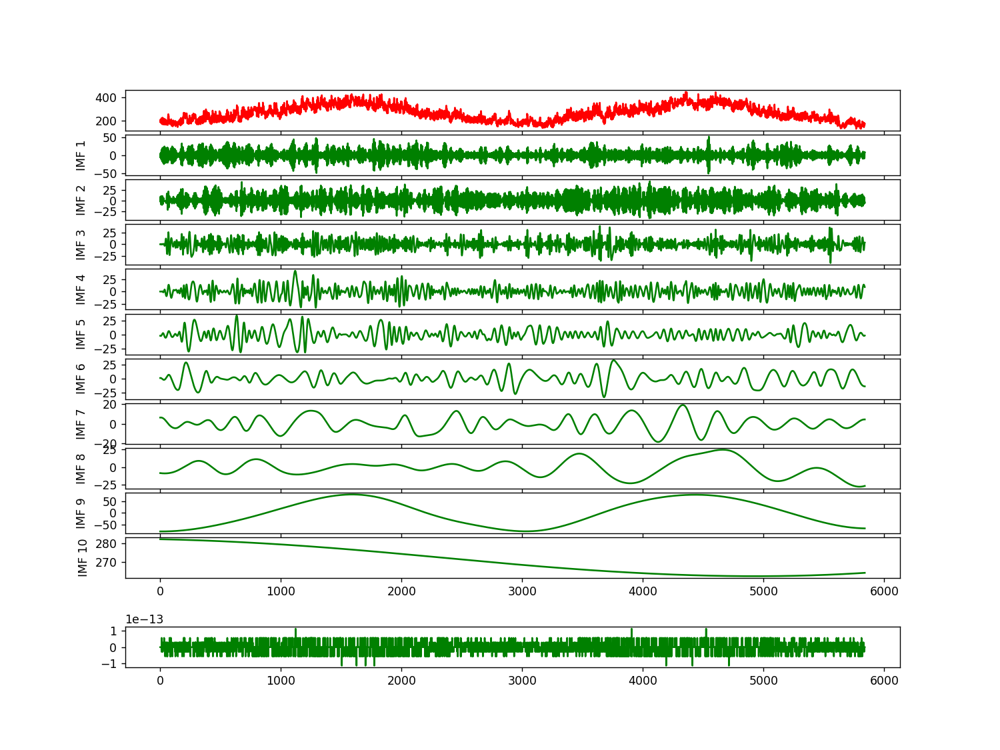

<IPython.core.display.Javascript object>


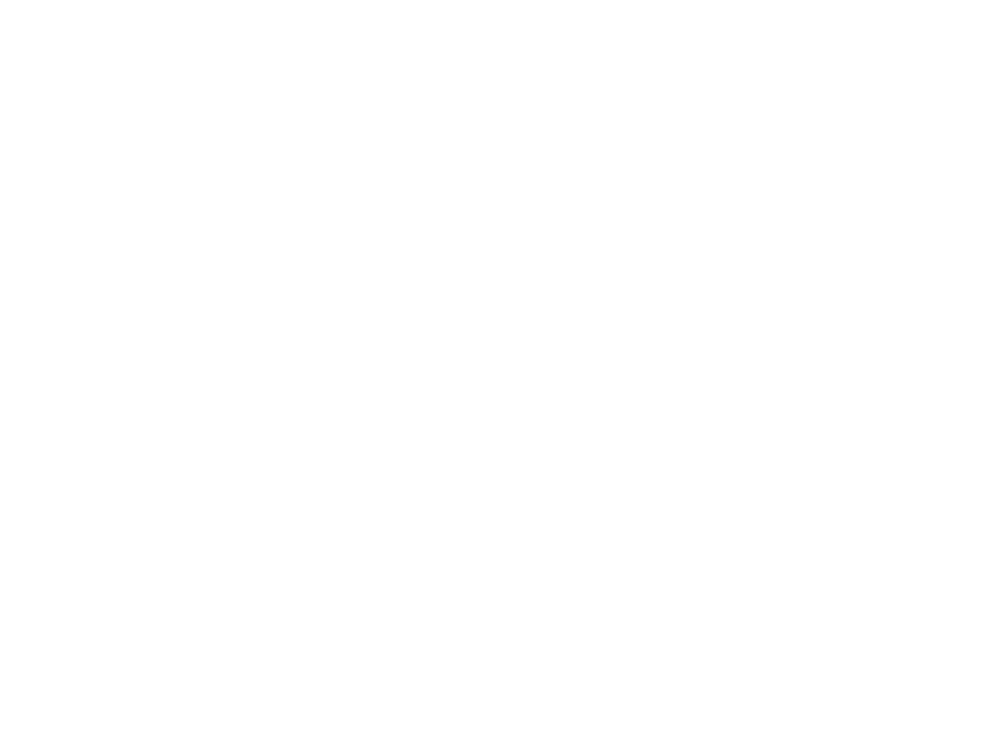

<IPython.core.display.Javascript object>


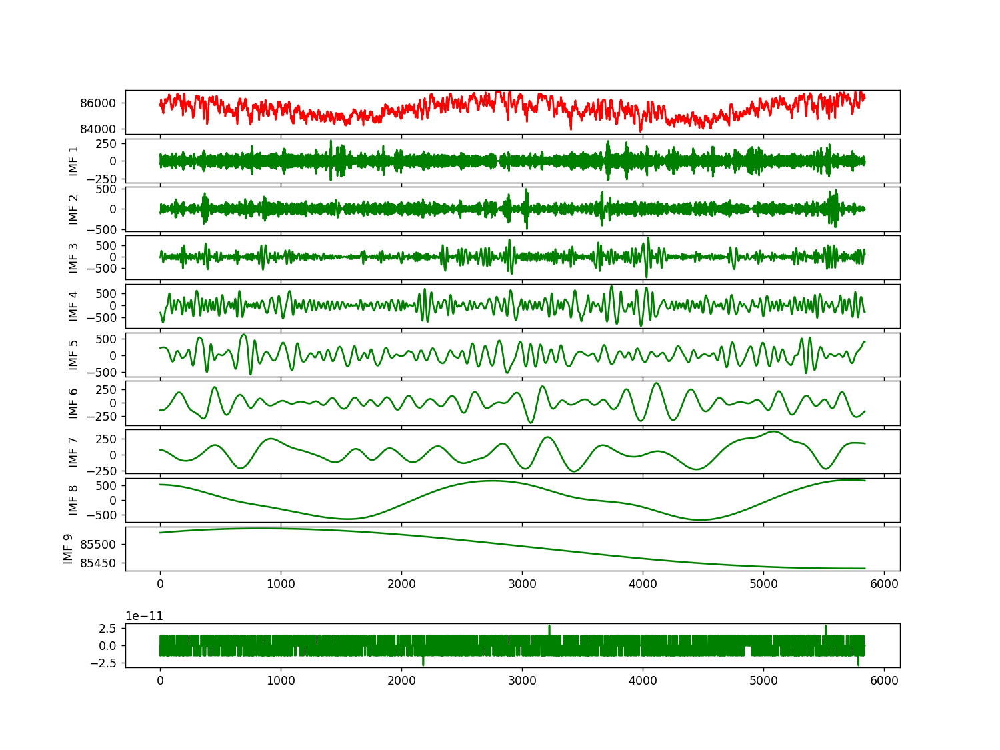

<IPython.core.display.Javascript object>


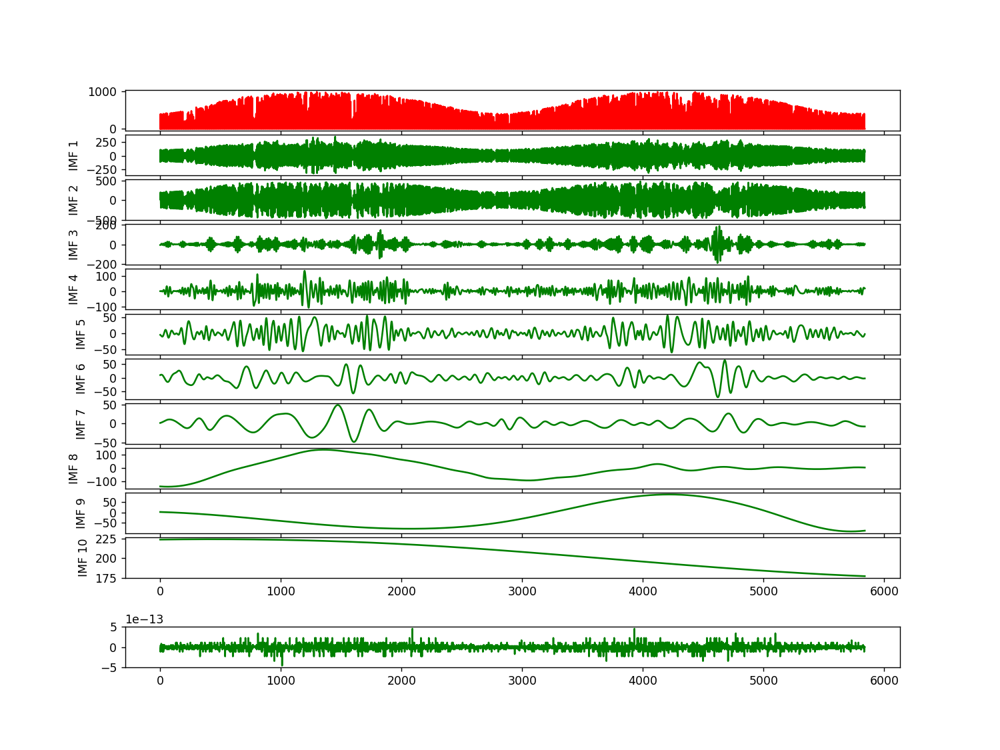

<IPython.core.display.Javascript object>


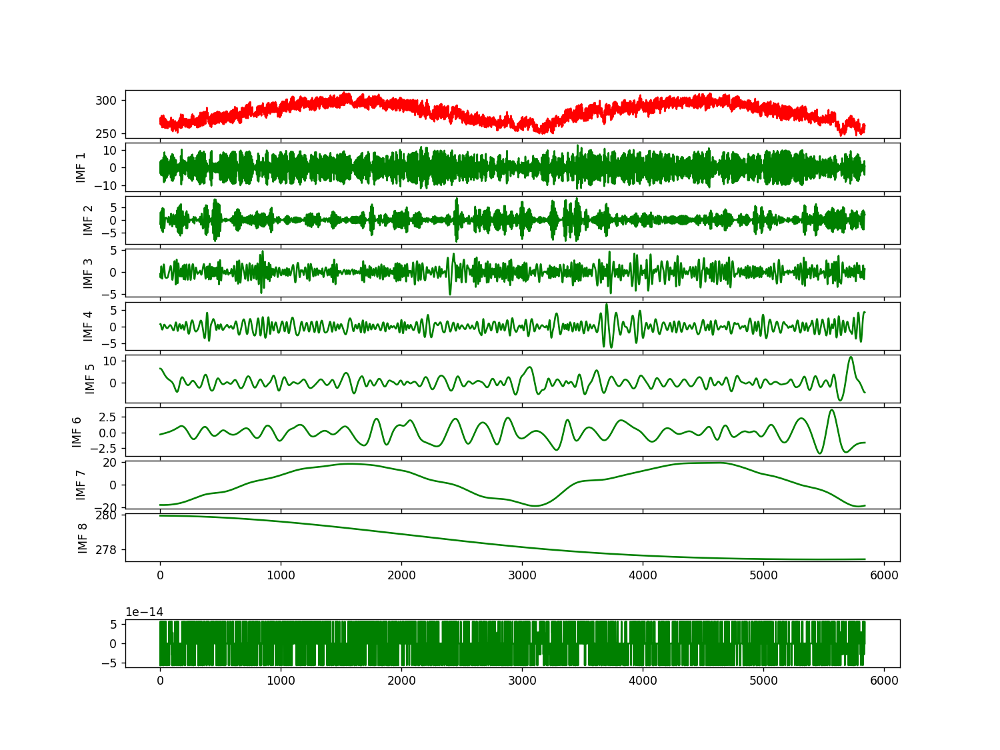

<IPython.core.display.Javascript object>


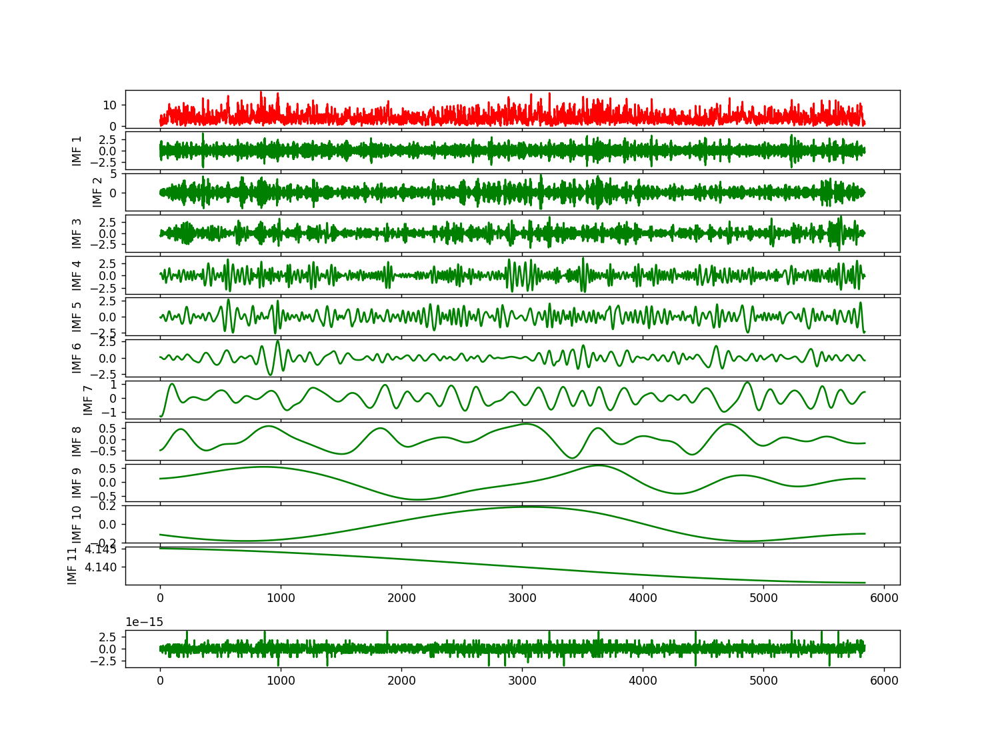

In [7]:
for item in ["lrad", "prec", "pres", "srad", "temp", "wind"]:
    res=ceemdan_decompose_res(data[item].to_numpy().ravel())
    IImfs.append(res)
# for item in ["lrad", "prec", "pres", "srad", "temp", "wind"]:
#     IImfs.append(data[item].to_numpy().ravel())

<IPython.core.display.Javascript object>


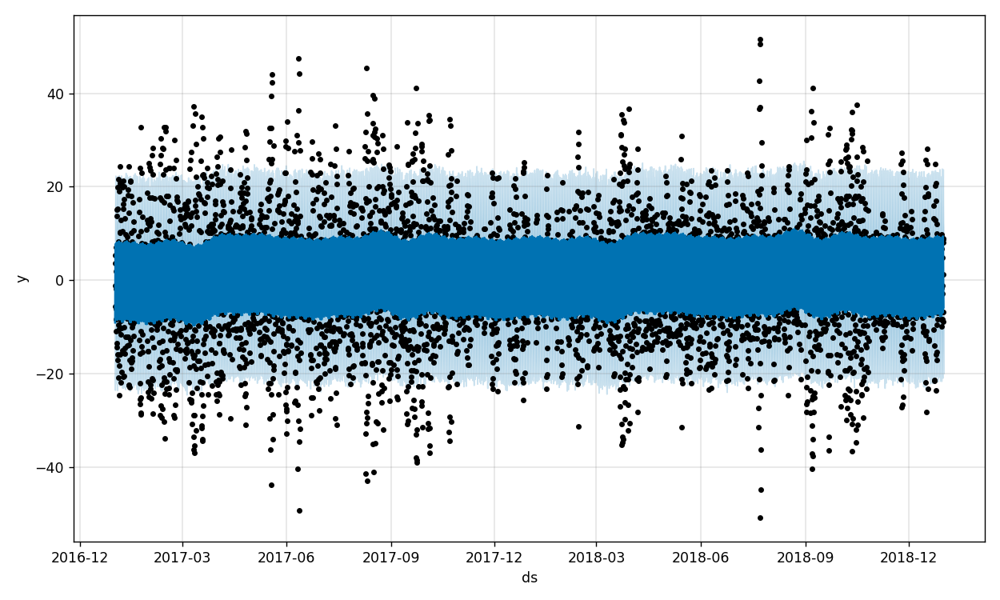

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  0.241894   -3.520620   23.731506     0.241894     0.241894   
5836  0.241977  -11.621038   16.462248     0.241977     0.241977   
5837  0.242061  -14.969400   12.403841     0.242061     0.242061   
5838  0.242144  -16.307591   11.403488     0.242144     0.242144   
5839  0.242228  -19.953495    7.753895     0.242228     0.242228   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        9.144916              9.144916              9.144916  8.999429   
5836        1.796585              1.796585              1.796585  1.685364   
5837       -1.070372             -1.070372             -1.070372 -1.151124   
5838       -3.423143             -3.423143             -3.423143 -3.483541   
5839       -6.097506             -6.097506             -6.097506 -6.152398   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     8.999429     8.999429 -0.002187 

<IPython.core.display.Javascript object>


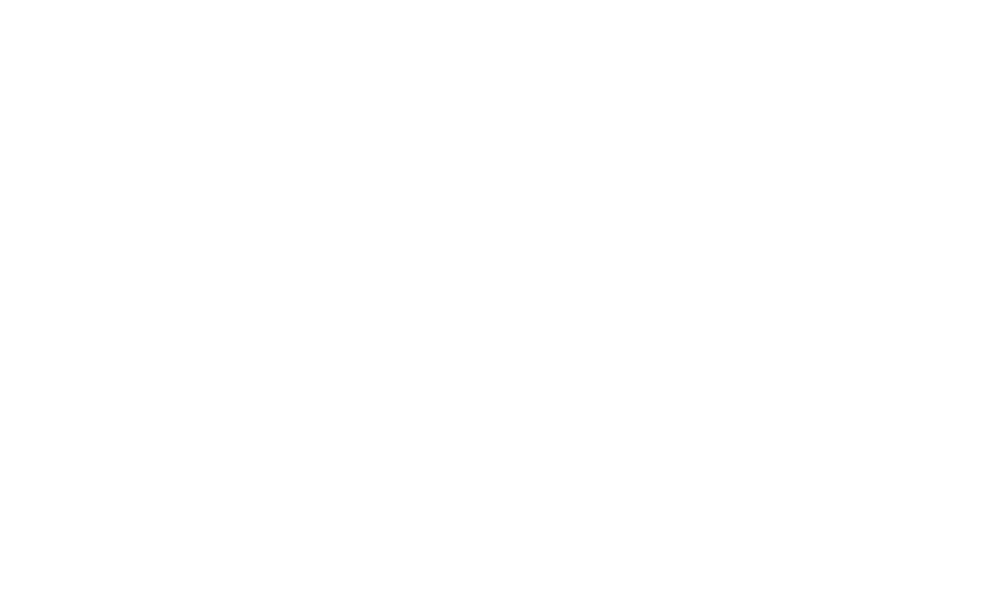

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  0.081242    1.764095   26.548093     0.081242     0.081242   
5836  0.081257   -3.649923   20.936441     0.081257     0.081257   
5837  0.081273  -13.198963   12.448153     0.081273     0.081273   
5838  0.081289  -21.802215    3.399080     0.081289     0.081289   
5839  0.081305  -24.929122   -0.927778     0.081305     0.081305   

      additive_terms  additive_terms_lower  additive_terms_upper      daily  \
5835       13.614374             13.614374             13.614374  13.432202   
5836        8.506246              8.506246              8.506246   8.309226   
5837       -0.659459             -0.659459             -0.659459  -0.869178   
5838       -9.290884             -9.290884             -9.290884  -9.511728   
5839      -13.028177            -13.028177            -13.028177 -13.258970   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper  \
5835    13.432202    13.432202  0.137733    

<IPython.core.display.Javascript object>


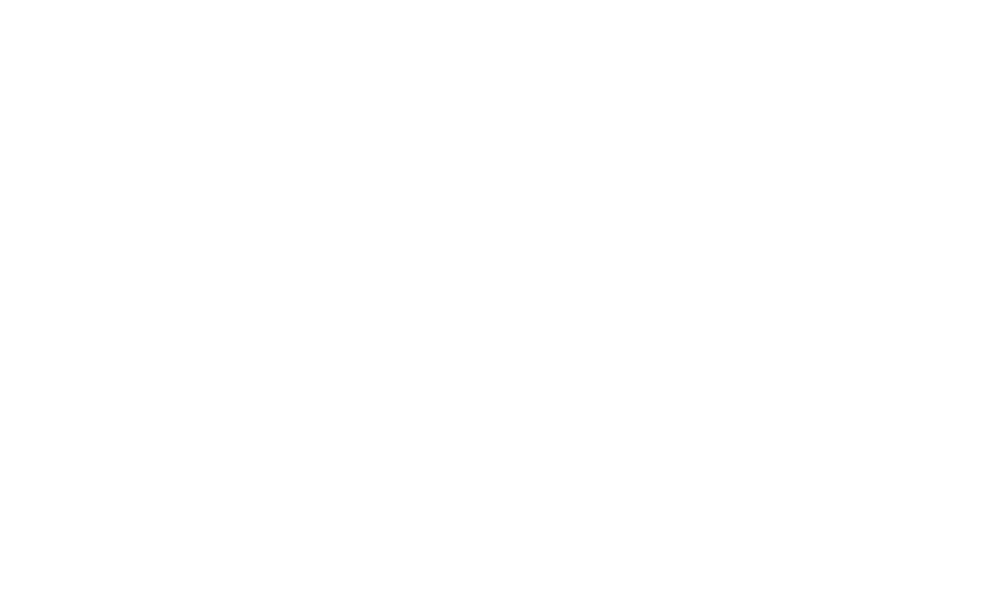

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835 -0.570025  -11.222713   13.748397    -0.570025    -0.570025   
5836 -0.570095  -11.747009   13.569953    -0.570095    -0.570095   
5837 -0.570164  -13.605691   11.679785    -0.570164    -0.570164   
5838 -0.570234  -13.964725   11.316781    -0.570234    -0.570234   
5839 -0.570304  -13.828933   11.603441    -0.570304    -0.570304   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        1.280653              1.280653              1.280653  0.563219   
5836        0.921126              0.921126              0.921126  0.472229   
5837        0.289527              0.289527              0.289527  0.108689   
5838       -0.364642             -0.364642             -0.364642 -0.307295   
5839       -0.779329             -0.779329             -0.779329 -0.542019   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     0.563219     0.563219  0.616550 

<IPython.core.display.Javascript object>


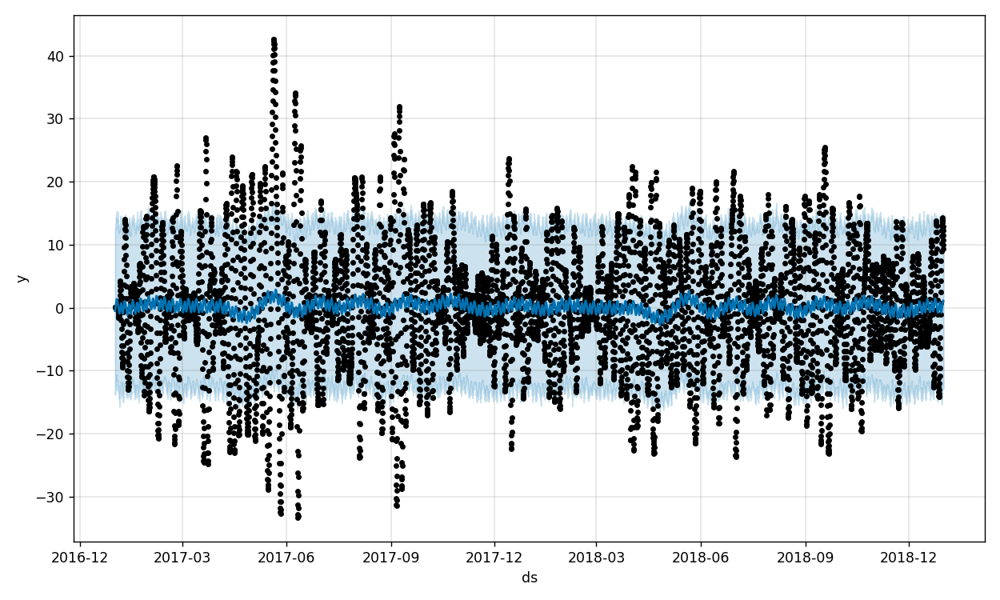

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835 -0.113726  -11.752363   14.251575    -0.113726    -0.113726   
5836 -0.113817  -12.849266   13.764572    -0.113817    -0.113817   
5837 -0.113907  -11.675517   14.043369    -0.113907    -0.113907   
5838 -0.113998  -12.479342   13.702376    -0.113998    -0.113998   
5839 -0.114089  -12.740982   14.444061    -0.114089    -0.114089   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        1.228565              1.228565              1.228565  0.008960   
5836        1.263869              1.263869              1.263869  0.011222   
5837        1.255161              1.255161              1.255161  0.007055   
5838        1.210492              1.210492              1.210492  0.000603   
5839        1.138452              1.138452              1.138452 -0.004208   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     0.008960     0.008960  0.150190 

<IPython.core.display.Javascript object>


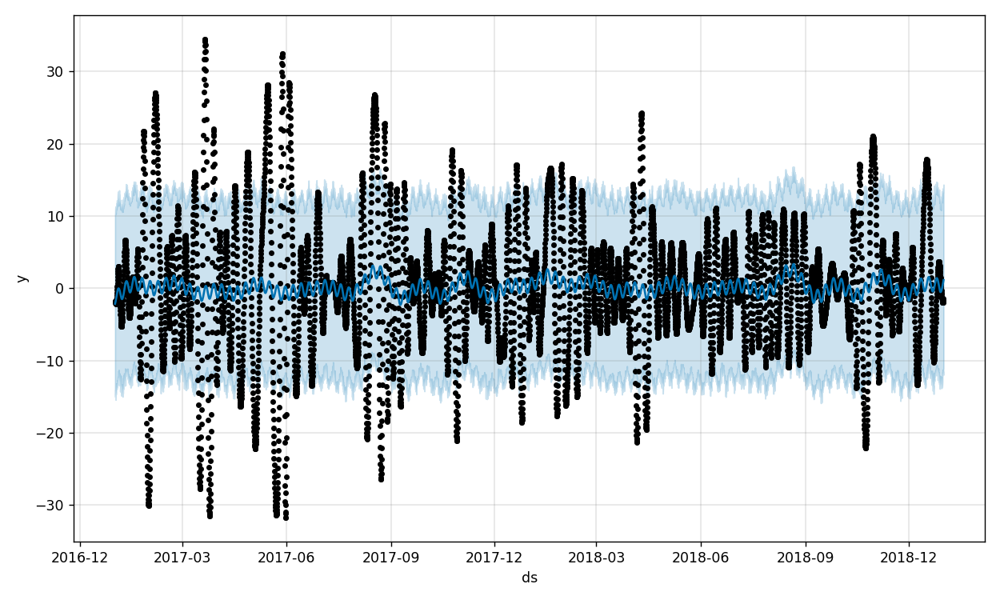

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  0.344192  -11.997996   13.844379     0.344192     0.344192   
5836  0.344256  -11.510792   13.460416     0.344256     0.344256   
5837  0.344321  -11.988614   13.261995     0.344321     0.344321   
5838  0.344385  -11.218369   13.652301     0.344385     0.344385   
5839  0.344450  -11.037387   14.340406     0.344450     0.344450   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        0.361994              0.361994              0.361994  0.000825   
5836        0.474979              0.474979              0.474979  0.000426   
5837        0.584919              0.584919              0.584919 -0.000396   
5838        0.690282              0.690282              0.690282 -0.001399   
5839        0.789635              0.789635              0.789635 -0.002276   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     0.000825     0.000825  0.180714 

<IPython.core.display.Javascript object>


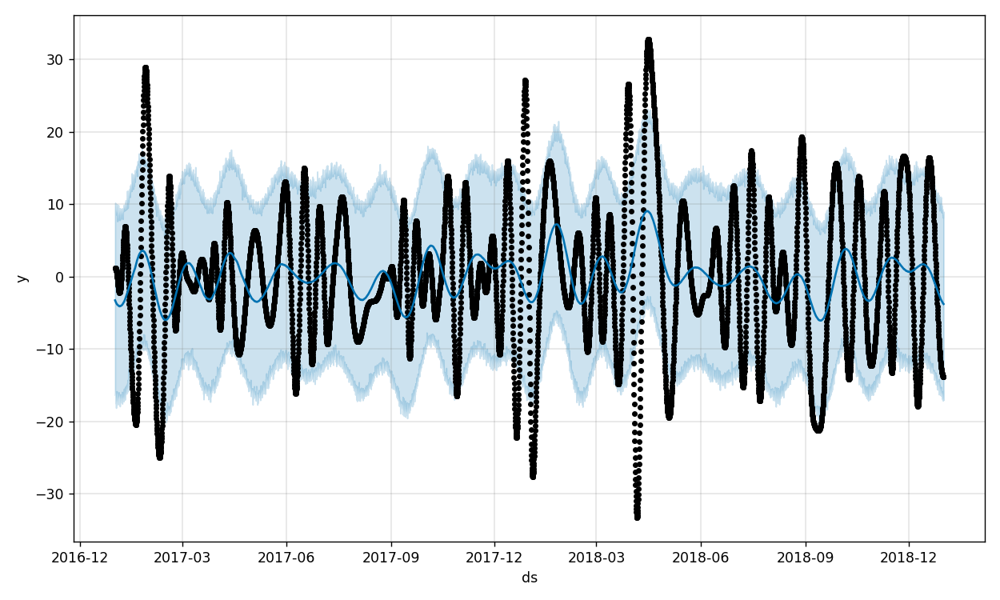

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  0.118709  -17.032209    8.901775     0.118709     0.118709   
5836  0.118556  -16.819698    8.139022     0.118556     0.118556   
5837  0.118404  -15.713299    8.938968     0.118404     0.118404   
5838  0.118252  -17.041676    8.998550     0.118252     0.118252   
5839  0.118099  -16.589961    8.369333     0.118099     0.118099   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835       -3.790555             -3.790555             -3.790555  0.001242   
5836       -3.818512             -3.818512             -3.818512 -0.001124   
5837       -3.843727             -3.843727             -3.843727 -0.003699   
5838       -3.866076             -3.866076             -3.866076 -0.006140   
5839       -3.886209             -3.886209             -3.886209 -0.008719   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     0.001242     0.001242 -3.766490 

<IPython.core.display.Javascript object>


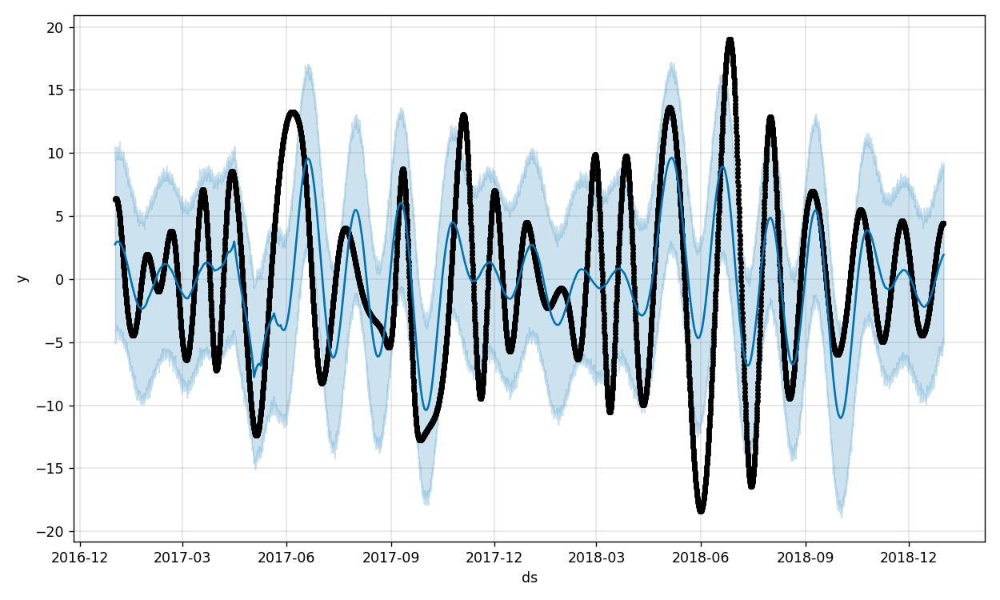

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835 -0.387062   -4.630273    9.026176    -0.387062    -0.387062   
5836 -0.387276   -5.267421    8.710922    -0.387276    -0.387276   
5837 -0.387489   -5.166855    8.895863    -0.387489    -0.387489   
5838 -0.387703   -4.938865    9.192741    -0.387703    -0.387703   
5839 -0.387917   -4.735233    8.861350    -0.387917    -0.387917   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        2.242269              2.242269              2.242269  0.000375   
5836        2.261337              2.261337              2.261337  0.000275   
5837        2.279026              2.279026              2.279026 -0.000110   
5838        2.295789              2.295789              2.295789 -0.000510   
5839        2.311818              2.311818              2.311818 -0.000904   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     0.000375     0.000375  2.225423 

<IPython.core.display.Javascript object>


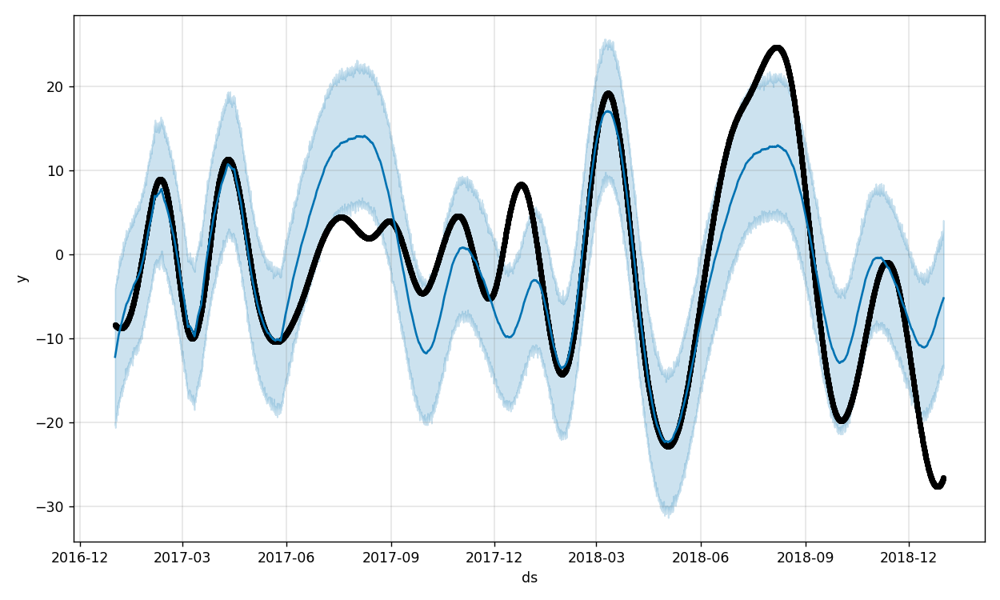

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835 -2.919792  -13.120384    2.606151    -2.919792    -2.919792   
5836 -2.920193  -13.447274    2.927468    -2.920193    -2.920193   
5837 -2.920594  -13.556761    4.100952    -2.920594    -2.920594   
5838 -2.920996  -13.365578    2.831245    -2.920996    -2.920996   
5839 -2.921397  -13.260976    2.575936    -2.921397    -2.921397   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835       -2.485969             -2.485969             -2.485969  0.002130   
5836       -2.434092             -2.434092             -2.434092 -0.002186   
5837       -2.378928             -2.378928             -2.378928 -0.006468   
5838       -2.321267             -2.321267             -2.321267 -0.010787   
5839       -2.262029             -2.262029             -2.262029 -0.015045   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     0.002130     0.002130 -2.417732 

<IPython.core.display.Javascript object>


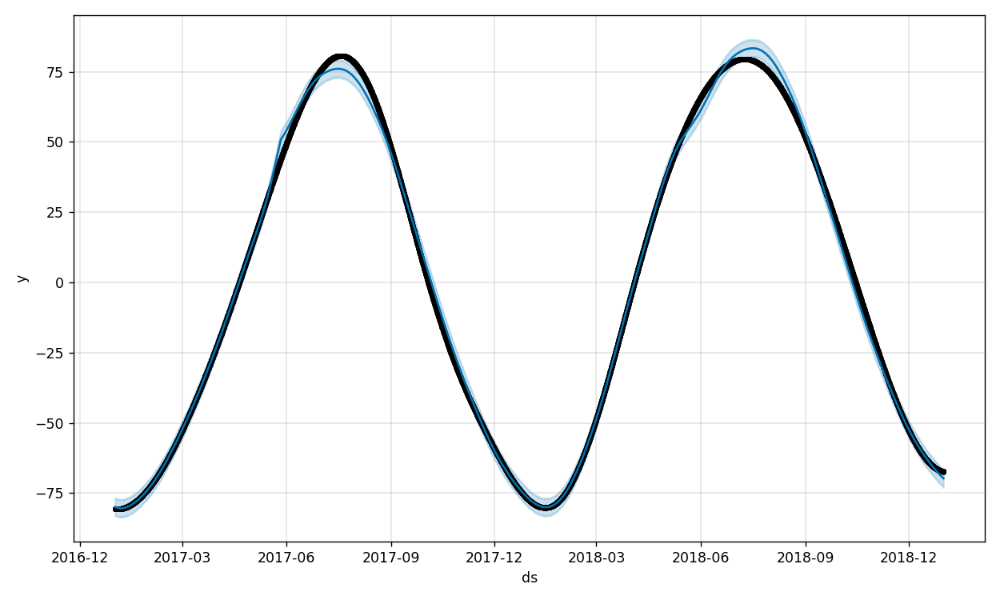

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  8.315728  -72.904026  -66.584913     8.315728     8.315728   
5836  8.318235  -72.510667  -66.427961     8.318235     8.318235   
5837  8.320742  -73.109541  -66.751136     8.320742     8.320742   
5838  8.323248  -72.801483  -66.531529     8.323248     8.323248   
5839  8.325755  -72.930934  -66.804766     8.325755     8.325755   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835      -77.914778            -77.914778            -77.914778 -0.000241   
5836      -77.963553            -77.963553            -77.963553  0.000437   
5837      -78.012962            -78.012962            -78.012962  0.000725   
5838      -78.062184            -78.062184            -78.062184  0.001385   
5839      -78.111881            -78.111881            -78.111881  0.001658   

      daily_lower  daily_upper     yearly  yearly_lower  yearly_upper  \
5835    -0.000241    -0.000241 -77.926266    -77.

<IPython.core.display.Javascript object>


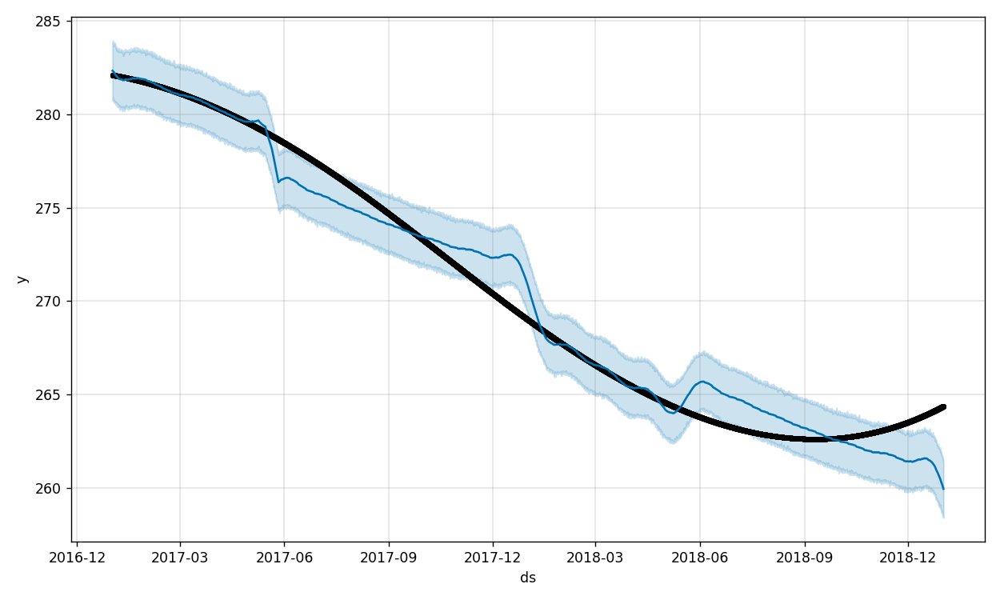

           trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  258.936745  258.559135  261.471274   258.936745   258.936745   
5836  258.933008  258.608823  261.592990   258.933008   258.933008   
5837  258.929272  258.417094  261.572082   258.929272   258.929272   
5838  258.925535  258.469786  261.501430   258.925535   258.925535   
5839  258.921798  258.391488  261.348648   258.921798   258.921798   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        1.114174              1.114174              1.114174 -0.000479   
5836        1.091894              1.091894              1.091894  0.000340   
5837        1.068719              1.068719              1.068719  0.001181   
5838        1.044816              1.044816              1.044816  0.002046   
5839        1.020374              1.020374              1.020374  0.002905   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper  \
5835    -0.000479    -0.000479  1.0992

<IPython.core.display.Javascript object>


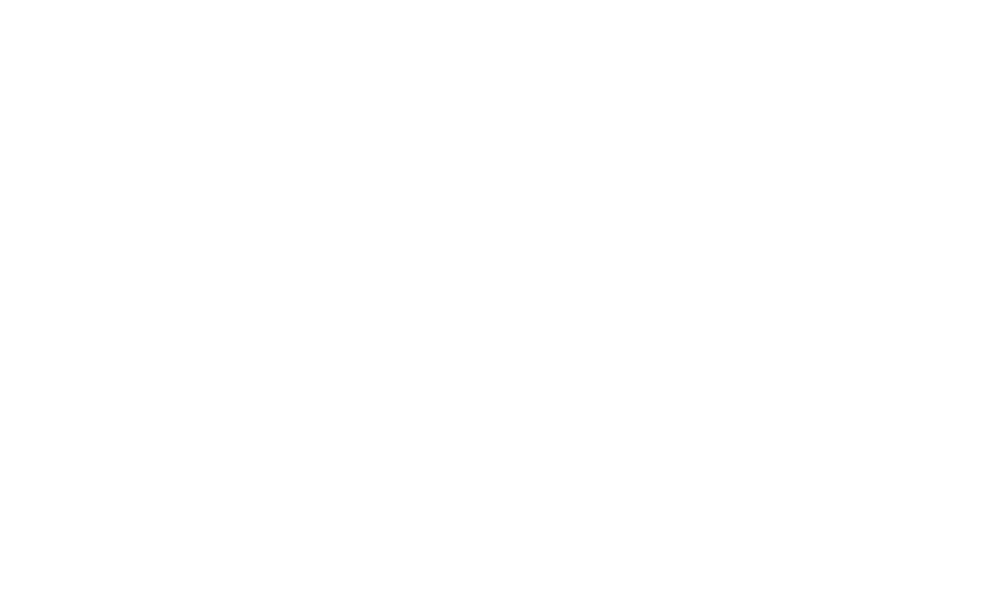

             trend    yhat_lower    yhat_upper   trend_lower   trend_upper  \
5835 -1.505371e-16 -3.060355e-14  3.592463e-14 -1.505371e-16 -1.505371e-16   
5836 -1.503994e-16 -3.272506e-14  3.554839e-14 -1.503994e-16 -1.503994e-16   
5837 -1.502617e-16 -3.319832e-14  3.192310e-14 -1.502617e-16 -1.502617e-16   
5838 -1.501239e-16 -3.419119e-14  3.469674e-14 -1.501239e-16 -1.501239e-16   
5839 -1.499862e-16 -3.182678e-14  3.493466e-14 -1.499862e-16 -1.499862e-16   

      additive_terms  additive_terms_lower  additive_terms_upper  \
5835    1.843568e-15          1.843568e-15          1.843568e-15   
5836    1.414547e-15          1.414547e-15          1.414547e-15   
5837    9.799318e-16          9.799318e-16          9.799318e-16   
5838    5.888422e-16          5.888422e-16          5.888422e-16   
5839    3.796811e-16          3.796811e-16          3.796811e-16   

             daily   daily_lower   daily_upper        yearly  yearly_lower  \
5835  7.725365e-16  7.725365e-16  7.725365e-

<IPython.core.display.Javascript object>


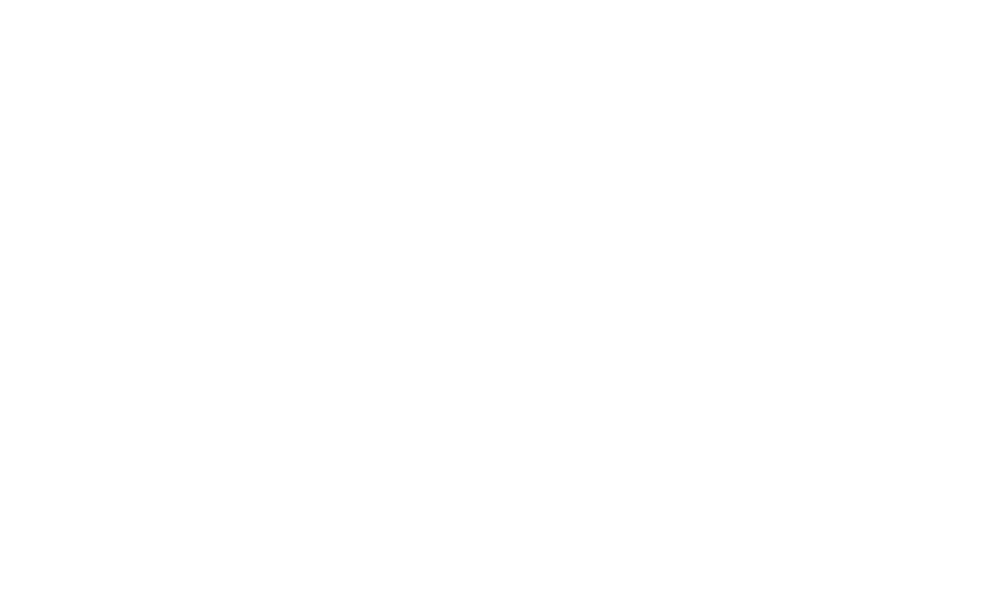

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  0.000452   -0.113179    0.123214     0.000452     0.000452   
5836  0.000452   -0.118383    0.129012     0.000452     0.000452   
5837  0.000452   -0.111971    0.125275     0.000452     0.000452   
5838  0.000451   -0.114208    0.125138     0.000451     0.000451   
5839  0.000451   -0.123586    0.131128     0.000451     0.000451   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        0.004988              0.004988              0.004988  0.002607   
5836        0.006261              0.006261              0.006261  0.003564   
5837        0.005233              0.005233              0.005233  0.002509   
5838        0.003477              0.003477              0.003477  0.000954   
5839        0.002450              0.002450              0.002450  0.000284   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     0.002607     0.002607 -0.000942 

<IPython.core.display.Javascript object>


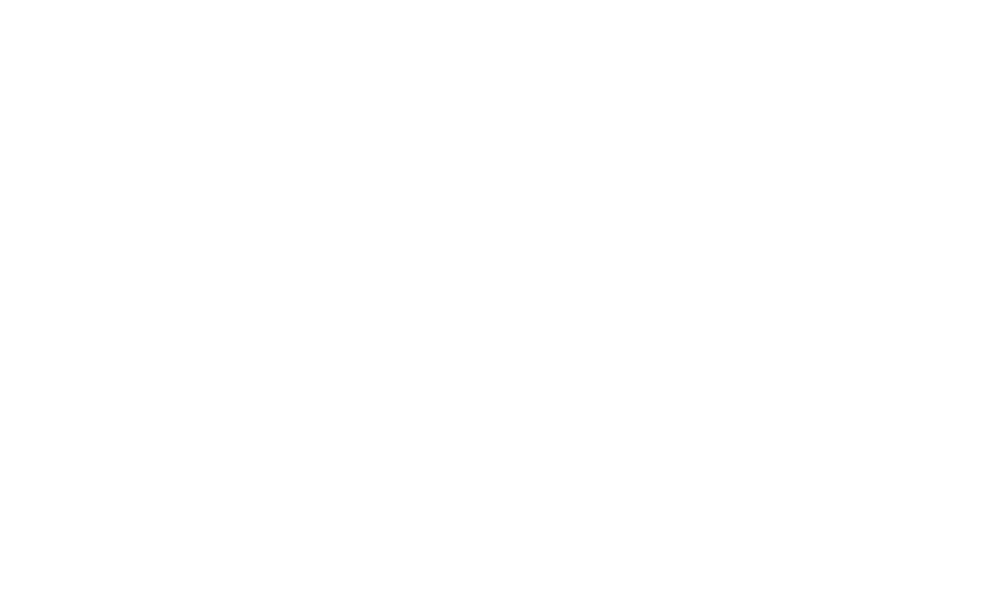

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  0.003842   -0.107424    0.103365     0.003842     0.003842   
5836  0.003844   -0.101796    0.112343     0.003844     0.003844   
5837  0.003845   -0.107195    0.106594     0.003845     0.003845   
5838  0.003846   -0.100568    0.112759     0.003846     0.003846   
5839  0.003847   -0.106716    0.103659     0.003847     0.003847   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835       -0.002658             -0.002658             -0.002658 -0.001033   
5836       -0.004449             -0.004449             -0.004449 -0.003008   
5837       -0.002549             -0.002549             -0.002549 -0.001344   
5838       -0.000101             -0.000101             -0.000101  0.000873   
5839       -0.000755             -0.000755             -0.000755  0.000052   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835    -0.001033    -0.001033 -0.001508 

<IPython.core.display.Javascript object>


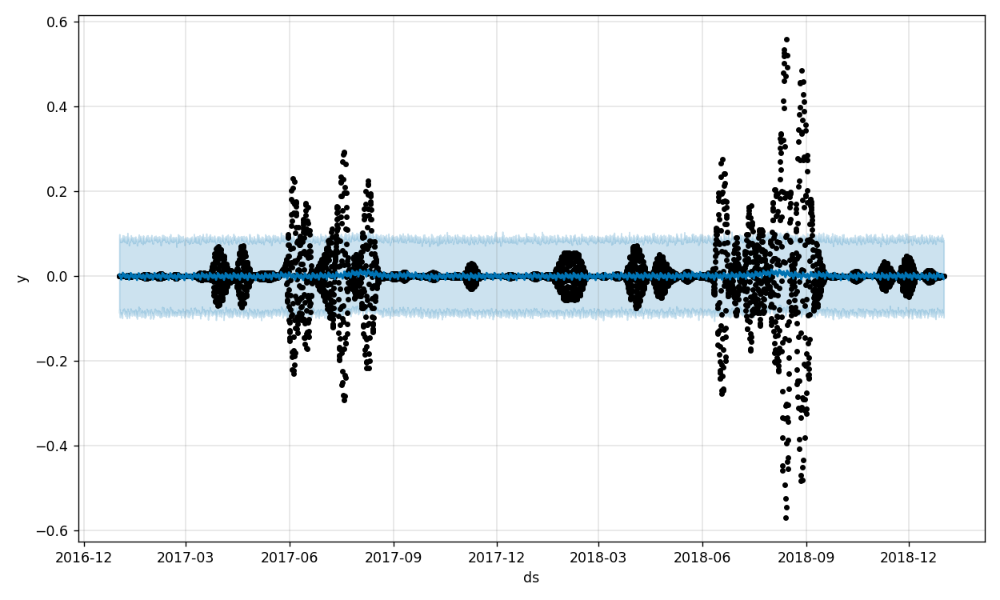

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  0.001428   -0.085291    0.082381     0.001428     0.001428   
5836  0.001429   -0.091040    0.083172     0.001429     0.001429   
5837  0.001429   -0.088382    0.085285     0.001429     0.001429   
5838  0.001429   -0.097693    0.081779     0.001429     0.001429   
5839  0.001429   -0.092791    0.080979     0.001429     0.001429   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835       -0.003750             -0.003750             -0.003750  0.000696   
5836       -0.006730             -0.006730             -0.006730 -0.001396   
5837       -0.008571             -0.008571             -0.008571 -0.002619   
5838       -0.008821             -0.008821             -0.008821 -0.002582   
5839       -0.007169             -0.007169             -0.007169 -0.001009   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     0.000696     0.000696 -0.000415 

C:\Users\j8843\anaconda3\lib\site-packages\prophet\plot.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)


<IPython.core.display.Javascript object>


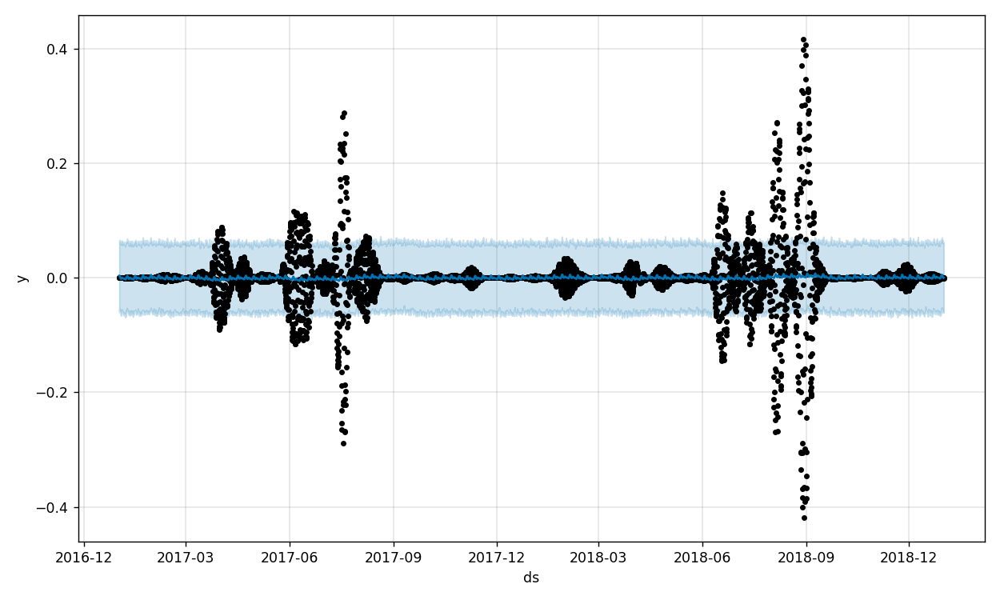

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  0.000915   -0.060113    0.060659     0.000915     0.000915   
5836  0.000915   -0.060900    0.061465     0.000915     0.000915   
5837  0.000915   -0.059760    0.060982     0.000915     0.000915   
5838  0.000916   -0.060783    0.060559     0.000916     0.000916   
5839  0.000916   -0.059546    0.062615     0.000916     0.000916   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835       -0.001161             -0.001161             -0.001161  0.000011   
5836       -0.001316             -0.001316             -0.001316 -0.000061   
5837       -0.001186             -0.001186             -0.001186 -0.000022   
5838       -0.000978             -0.000978             -0.000978 -0.000051   
5839       -0.000637             -0.000637             -0.000637 -0.000052   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     0.000011     0.000011  0.000247 

<IPython.core.display.Javascript object>


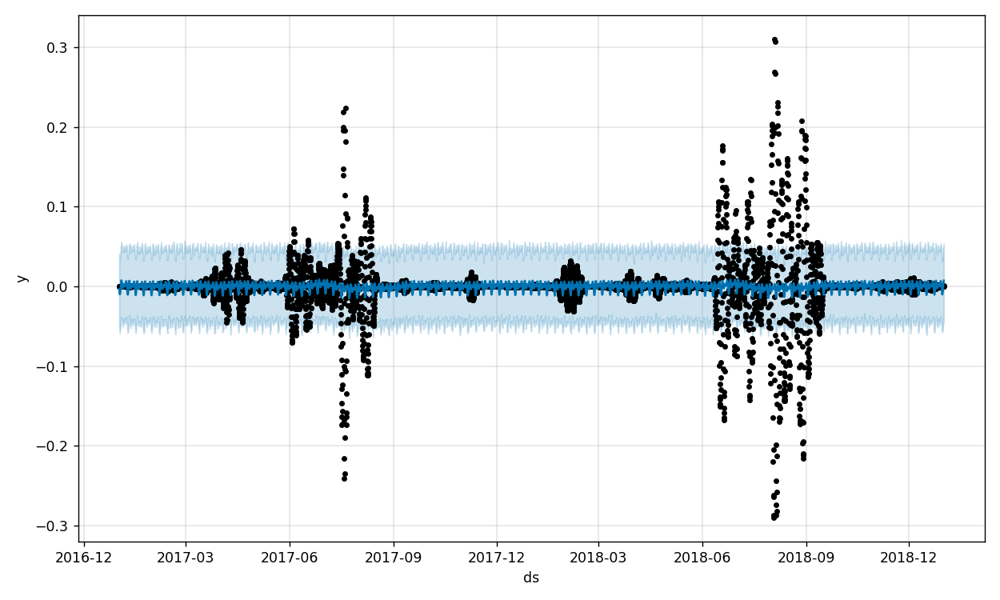

        trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835 -0.00043   -0.047356    0.046227     -0.00043     -0.00043   
5836 -0.00043   -0.039019    0.049746     -0.00043     -0.00043   
5837 -0.00043   -0.043044    0.048655     -0.00043     -0.00043   
5838 -0.00043   -0.040251    0.052219     -0.00043     -0.00043   
5839 -0.00043   -0.040444    0.053763     -0.00043     -0.00043   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        0.001632              0.001632              0.001632 -0.000042   
5836        0.003842              0.003842              0.003842 -0.000081   
5837        0.005688              0.005688              0.005688 -0.000069   
5838        0.007015              0.007015              0.007015 -0.000029   
5839        0.007728              0.007728              0.007728  0.000024   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835    -0.000042    -0.000042  0.001005      0

<IPython.core.display.Javascript object>


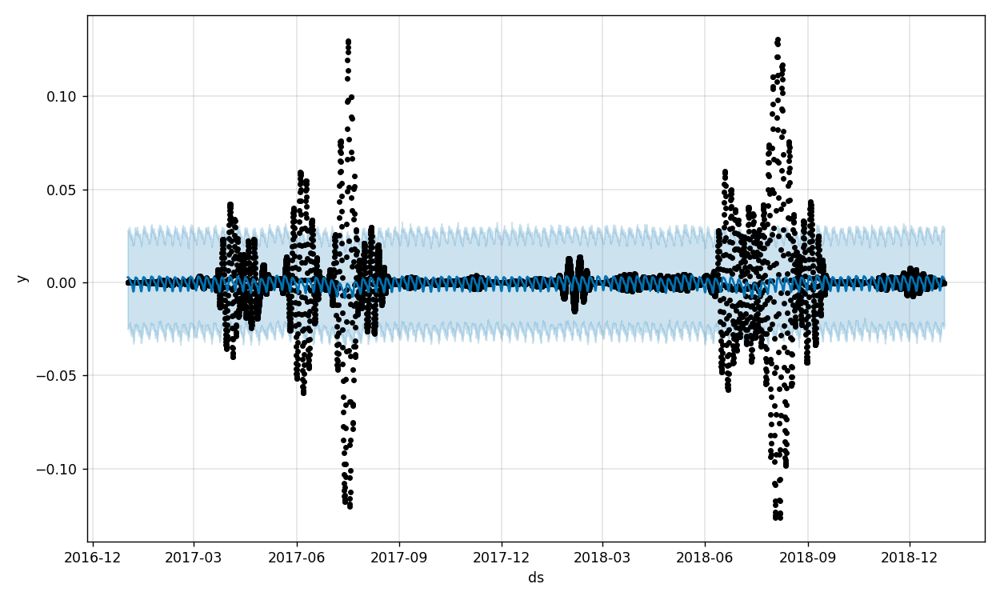

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835 -0.000182   -0.024788    0.027575    -0.000182    -0.000182   
5836 -0.000182   -0.021480    0.029005    -0.000182    -0.000182   
5837 -0.000181   -0.023231    0.028421    -0.000181    -0.000181   
5838 -0.000181   -0.022126    0.029410    -0.000181    -0.000181   
5839 -0.000181   -0.023728    0.028244    -0.000181    -0.000181   

      additive_terms  additive_terms_lower  additive_terms_upper  \
5835        0.002737              0.002737              0.002737   
5836        0.002638              0.002638              0.002638   
5837        0.002495              0.002495              0.002495   
5838        0.002312              0.002312              0.002312   
5839        0.002095              0.002095              0.002095   

             daily   daily_lower   daily_upper    yearly  yearly_lower  \
5835  1.925603e-05  1.925603e-05  1.925603e-05  0.000256      0.000256   
5836  1.411563e-05  1.411563e-05  

<IPython.core.display.Javascript object>


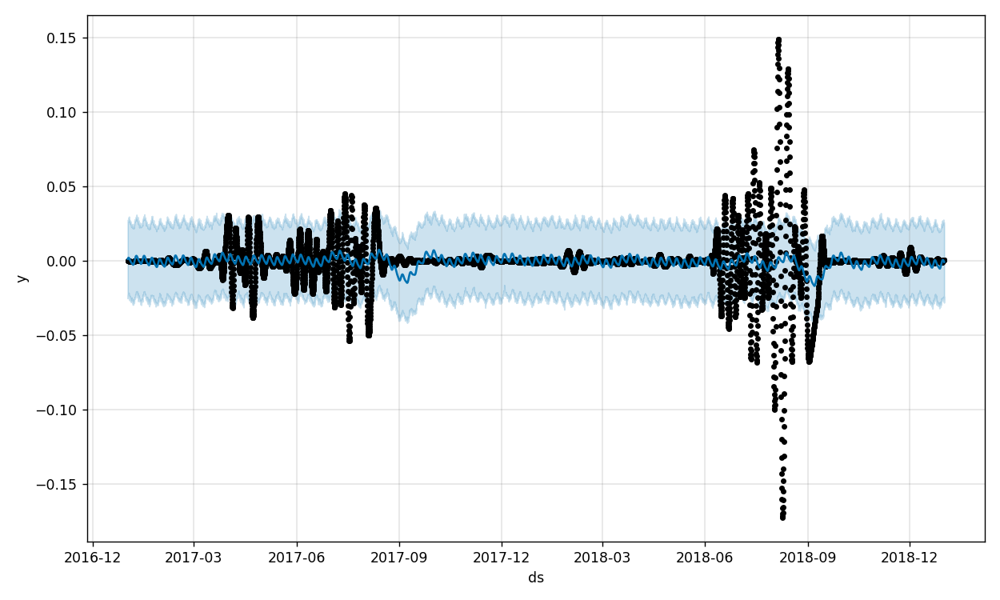

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835 -0.002073   -0.025337    0.025499    -0.002073    -0.002073   
5836 -0.002074   -0.026040    0.026438    -0.002074    -0.002074   
5837 -0.002074   -0.023757    0.026100    -0.002074    -0.002074   
5838 -0.002075   -0.028007    0.025992    -0.002075    -0.002075   
5839 -0.002076   -0.025781    0.023790    -0.002076    -0.002076   

      additive_terms  additive_terms_lower  additive_terms_upper  \
5835        0.002274              0.002274              0.002274   
5836        0.002078              0.002078              0.002078   
5837        0.001860              0.001860              0.001860   
5838        0.001626              0.001626              0.001626   
5839        0.001383              0.001383              0.001383   

             daily   daily_lower   daily_upper    yearly  yearly_lower  \
5835 -8.425788e-07 -8.425788e-07 -8.425788e-07 -0.000014     -0.000014   
5836  1.325010e-06  1.325010e-06  

<IPython.core.display.Javascript object>


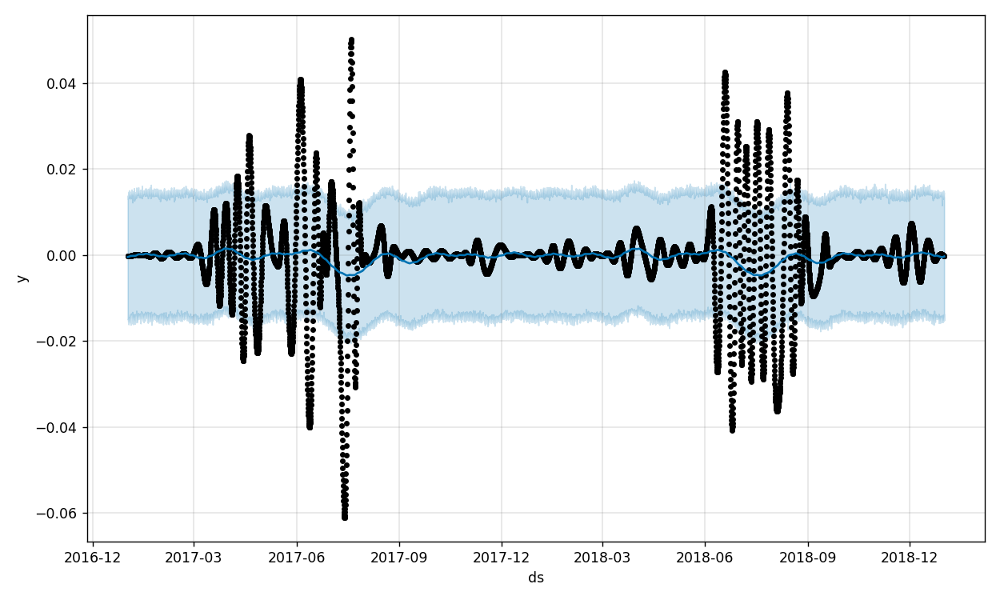

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835 -0.000457   -0.015086    0.013694    -0.000457    -0.000457   
5836 -0.000457   -0.014426    0.014071    -0.000457    -0.000457   
5837 -0.000457   -0.014549    0.014620    -0.000457    -0.000457   
5838 -0.000457   -0.013753    0.013652    -0.000457    -0.000457   
5839 -0.000457   -0.015200    0.013377    -0.000457    -0.000457   

      additive_terms  additive_terms_lower  additive_terms_upper  \
5835        0.000073              0.000073              0.000073   
5836        0.000087              0.000087              0.000087   
5837        0.000100              0.000100              0.000100   
5838        0.000113              0.000113              0.000113   
5839        0.000125              0.000125              0.000125   

             daily   daily_lower   daily_upper    yearly  yearly_lower  \
5835 -6.227930e-08 -6.227930e-08 -6.227930e-08  0.000053      0.000053   
5836 -1.088299e-07 -1.088299e-07 -

<IPython.core.display.Javascript object>


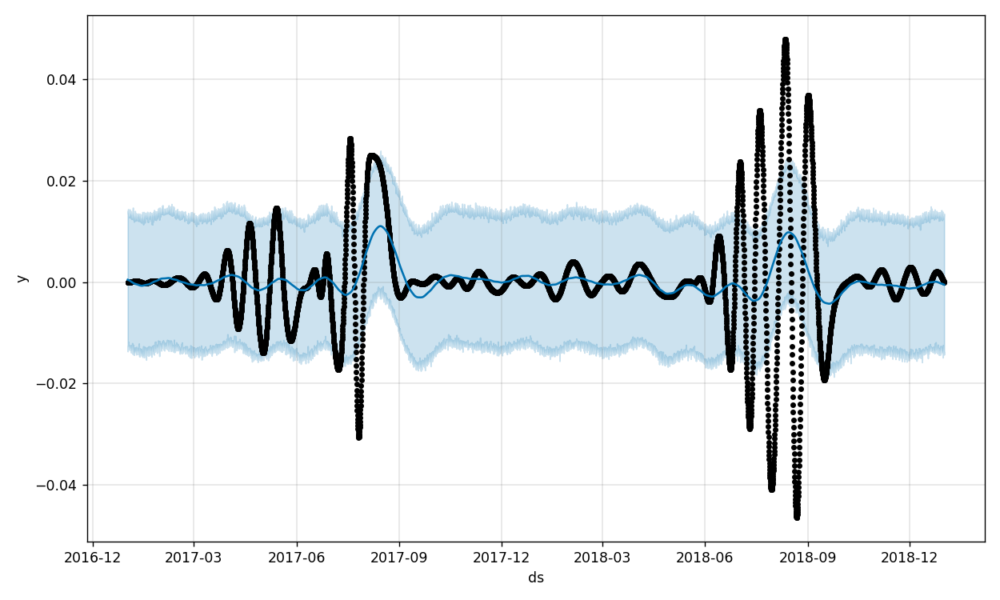

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835 -0.000713   -0.012639    0.012738    -0.000713    -0.000713   
5836 -0.000713   -0.013892    0.012772    -0.000713    -0.000713   
5837 -0.000714   -0.013695    0.013226    -0.000714    -0.000714   
5838 -0.000714   -0.014334    0.013503    -0.000714    -0.000714   
5839 -0.000715   -0.014264    0.013126    -0.000715    -0.000715   

      additive_terms  additive_terms_lower  additive_terms_upper  \
5835        0.000256              0.000256              0.000256   
5836        0.000243              0.000243              0.000243   
5837        0.000230              0.000230              0.000230   
5838        0.000215              0.000215              0.000215   
5839        0.000201              0.000201              0.000201   

             daily   daily_lower   daily_upper    yearly  yearly_lower  \
5835  2.670694e-07  2.670694e-07  2.670694e-07  0.000217      0.000217   
5836 -2.250122e-07 -2.250122e-07 -

<IPython.core.display.Javascript object>


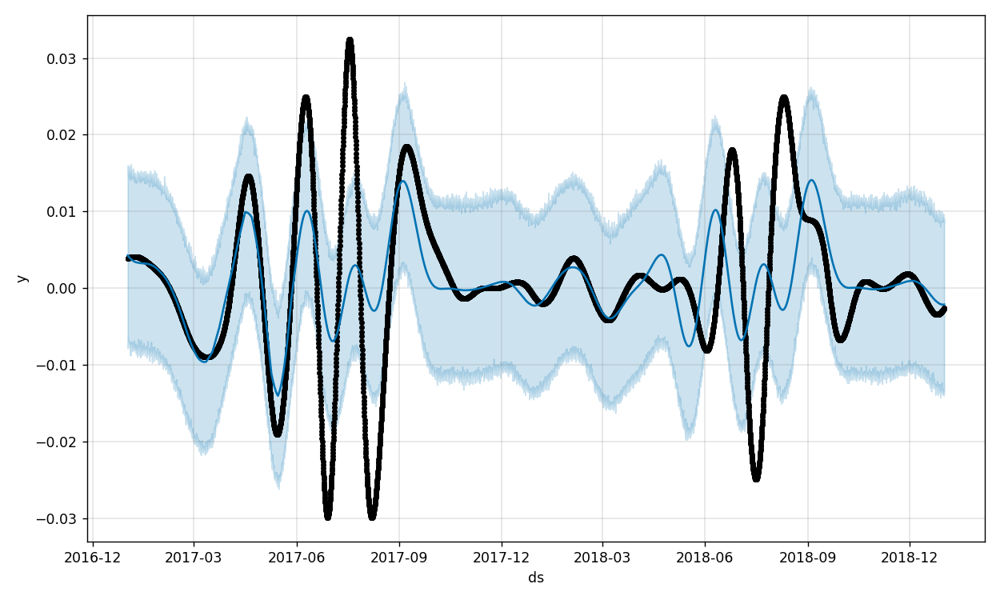

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  0.000974   -0.014031    0.008886     0.000974     0.000974   
5836  0.000974   -0.013816    0.008876     0.000974     0.000974   
5837  0.000974   -0.013816    0.009123     0.000974     0.000974   
5838  0.000974   -0.013289    0.008538     0.000974     0.000974   
5839  0.000974   -0.013388    0.009104     0.000974     0.000974   

      additive_terms  additive_terms_lower  additive_terms_upper  \
5835       -0.003134             -0.003134             -0.003134   
5836       -0.003132             -0.003132             -0.003132   
5837       -0.003129             -0.003129             -0.003129   
5838       -0.003126             -0.003126             -0.003126   
5839       -0.003122             -0.003122             -0.003122   

             daily   daily_lower   daily_upper    yearly  yearly_lower  \
5835  2.214039e-07  2.214039e-07  2.214039e-07 -0.003137     -0.003137   
5836  1.862644e-08  1.862644e-08  

<IPython.core.display.Javascript object>


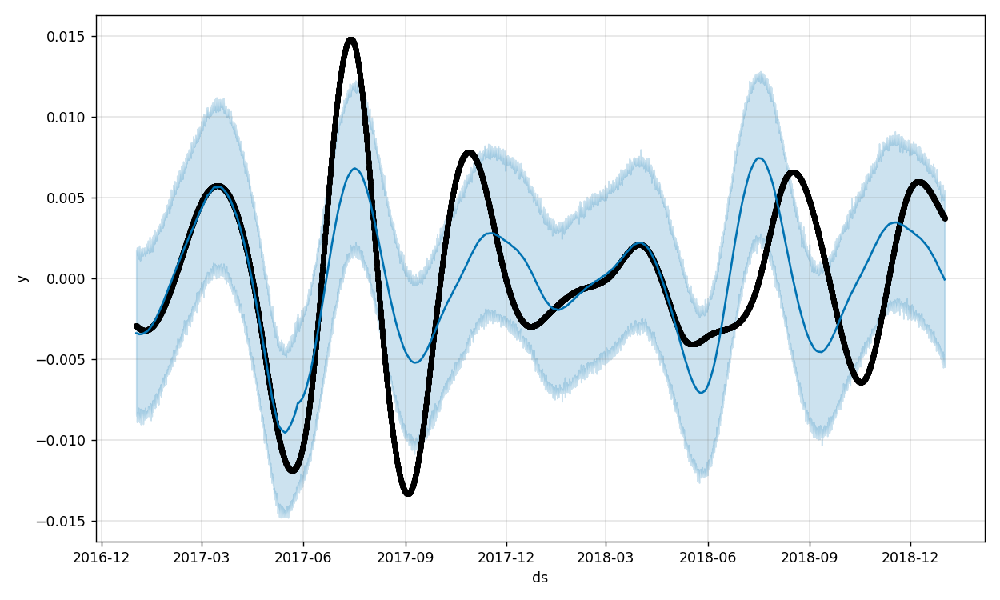

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  0.000399   -0.005438    0.005226     0.000399     0.000399   
5836  0.000399   -0.005256    0.005186     0.000399     0.000399   
5837  0.000399   -0.004672    0.005416     0.000399     0.000399   
5838  0.000399   -0.005465    0.005456     0.000399     0.000399   
5839  0.000400   -0.005394    0.005185     0.000400     0.000400   

      additive_terms  additive_terms_lower  additive_terms_upper  \
5835       -0.000370             -0.000370             -0.000370   
5836       -0.000389             -0.000389             -0.000389   
5837       -0.000410             -0.000410             -0.000410   
5838       -0.000430             -0.000430             -0.000430   
5839       -0.000451             -0.000451             -0.000451   

             daily   daily_lower   daily_upper    yearly  yearly_lower  \
5835 -2.836865e-07 -2.836865e-07 -2.836865e-07 -0.000387     -0.000387   
5836  3.733210e-07  3.733210e-07  

<IPython.core.display.Javascript object>


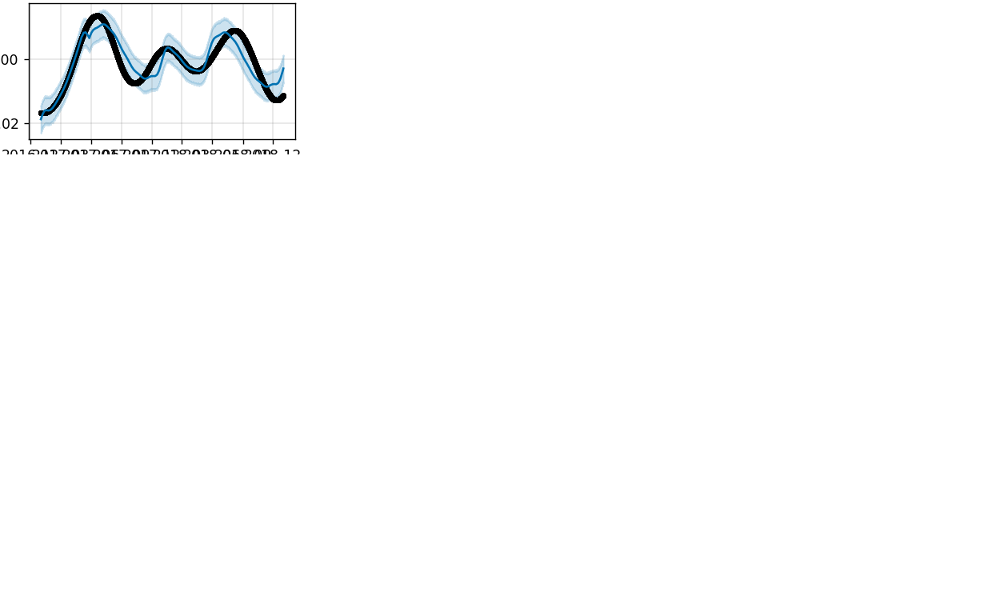

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835 -0.001734   -0.007473    0.001065    -0.001734    -0.001734   
5836 -0.001735   -0.007413    0.001189    -0.001735    -0.001735   
5837 -0.001736   -0.007057    0.001317    -0.001736    -0.001736   
5838 -0.001736   -0.007623    0.001347    -0.001736    -0.001736   
5839 -0.001737   -0.006980    0.001080    -0.001737    -0.001737   

      additive_terms  additive_terms_lower  additive_terms_upper  \
5835       -0.001386             -0.001386             -0.001386   
5836       -0.001335             -0.001335             -0.001335   
5837       -0.001283             -0.001283             -0.001283   
5838       -0.001229             -0.001229             -0.001229   
5839       -0.001174             -0.001174             -0.001174   

             daily   daily_lower   daily_upper    yearly  yearly_lower  \
5835  8.390455e-07  8.390455e-07  8.390455e-07 -0.001358     -0.001358   
5836 -9.467661e-07 -9.467661e-07 -

<IPython.core.display.Javascript object>


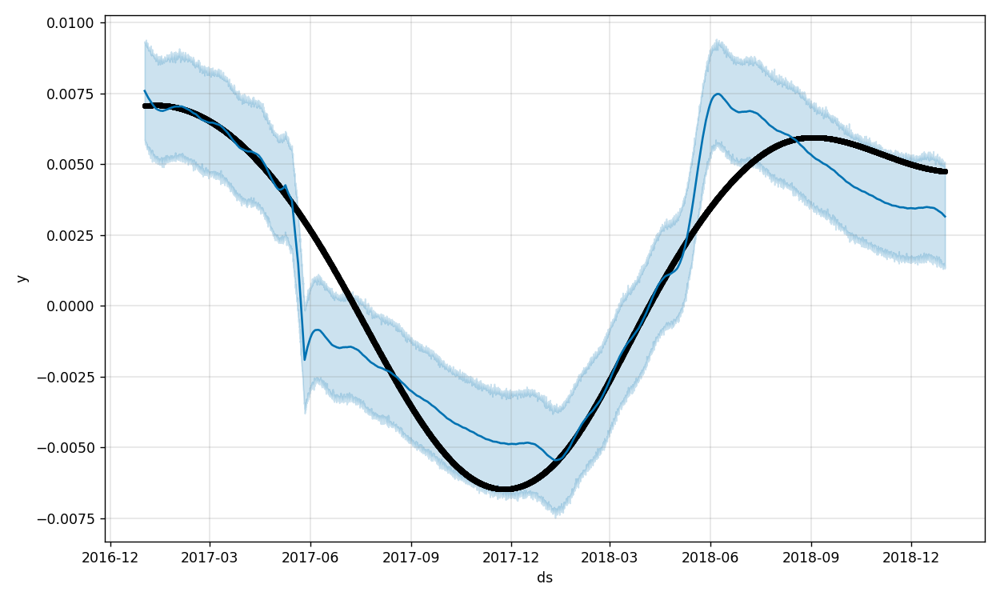

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  0.006671    0.001319    0.004988     0.006671     0.006671   
5836  0.006674    0.001458    0.004983     0.006674     0.006674   
5837  0.006677    0.001390    0.005079     0.006677     0.006677   
5838  0.006680    0.001331    0.004890     0.006680     0.006680   
5839  0.006683    0.001471    0.004812     0.006683     0.006683   

      additive_terms  additive_terms_lower  additive_terms_upper  \
5835       -0.003497             -0.003497             -0.003497   
5836       -0.003505             -0.003505             -0.003505   
5837       -0.003514             -0.003514             -0.003514   
5838       -0.003522             -0.003522             -0.003522   
5839       -0.003531             -0.003531             -0.003531   

             daily   daily_lower   daily_upper    yearly  yearly_lower  \
5835 -2.366434e-07 -2.366434e-07 -2.366434e-07 -0.003498     -0.003498   
5836  1.263364e-07  1.263364e-07  

<IPython.core.display.Javascript object>


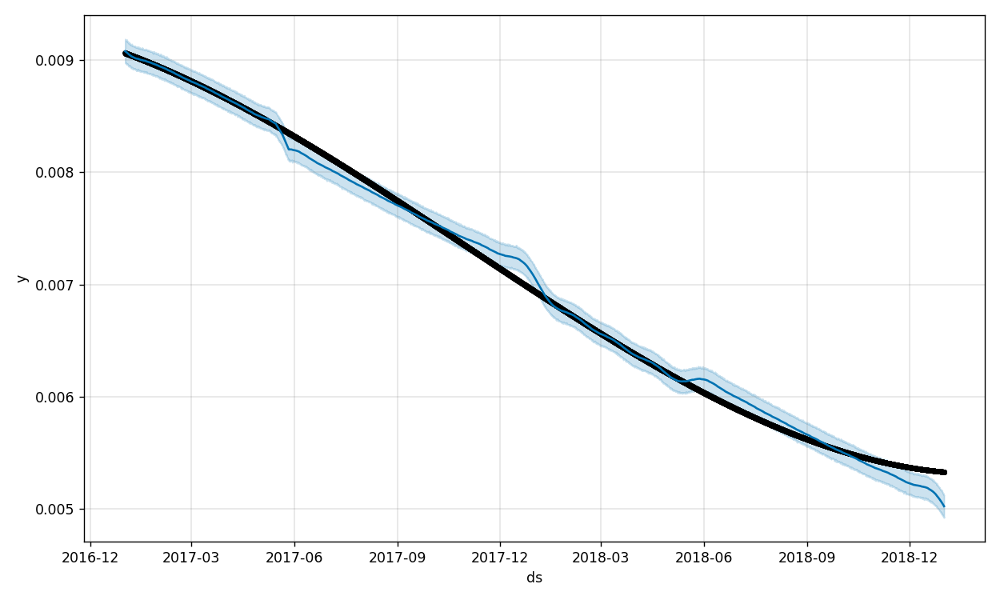

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  0.004946    0.004927    0.005138     0.004946     0.004946   
5836  0.004945    0.004927    0.005128     0.004945     0.004945   
5837  0.004944    0.004923    0.005128     0.004944     0.004944   
5838  0.004944    0.004931    0.005121     0.004944     0.004944   
5839  0.004943    0.004920    0.005123     0.004943     0.004943   

      additive_terms  additive_terms_lower  additive_terms_upper  \
5835        0.000086              0.000086              0.000086   
5836        0.000085              0.000085              0.000085   
5837        0.000083              0.000083              0.000083   
5838        0.000081              0.000081              0.000081   
5839        0.000080              0.000080              0.000080   

             daily   daily_lower   daily_upper    yearly  yearly_lower  \
5835 -3.091430e-08 -3.091430e-08 -3.091430e-08  0.000085      0.000085   
5836  2.206692e-08  2.206692e-08  

<IPython.core.display.Javascript object>


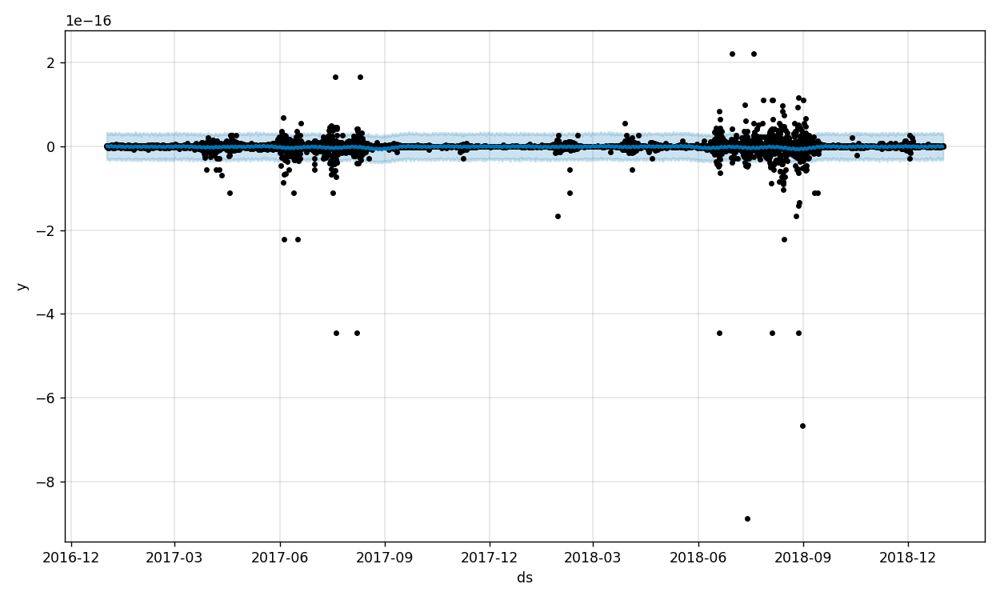

             trend    yhat_lower    yhat_upper   trend_lower   trend_upper  \
5835 -8.271623e-19 -3.089610e-17  3.099394e-17 -8.271623e-19 -8.271623e-19   
5836 -8.271876e-19 -3.075999e-17  3.047432e-17 -8.271876e-19 -8.271876e-19   
5837 -8.272129e-19 -3.350779e-17  3.154964e-17 -8.272129e-19 -8.272129e-19   
5838 -8.272382e-19 -3.100872e-17  3.026476e-17 -8.272382e-19 -8.272382e-19   
5839 -8.272634e-19 -3.225819e-17  2.852840e-17 -8.272634e-19 -8.272634e-19   

      additive_terms  additive_terms_lower  additive_terms_upper  \
5835   -4.448997e-19         -4.448997e-19         -4.448997e-19   
5836    1.648373e-18          1.648373e-18          1.648373e-18   
5837    6.041493e-19          6.041493e-19          6.041493e-19   
5838   -8.793302e-20         -8.793302e-20         -8.793302e-20   
5839    9.120790e-21          9.120790e-21          9.120790e-21   

             daily   daily_lower   daily_upper        yearly  yearly_lower  \
5835 -9.346216e-19 -9.346216e-19 -9.346216e-

<IPython.core.display.Javascript object>


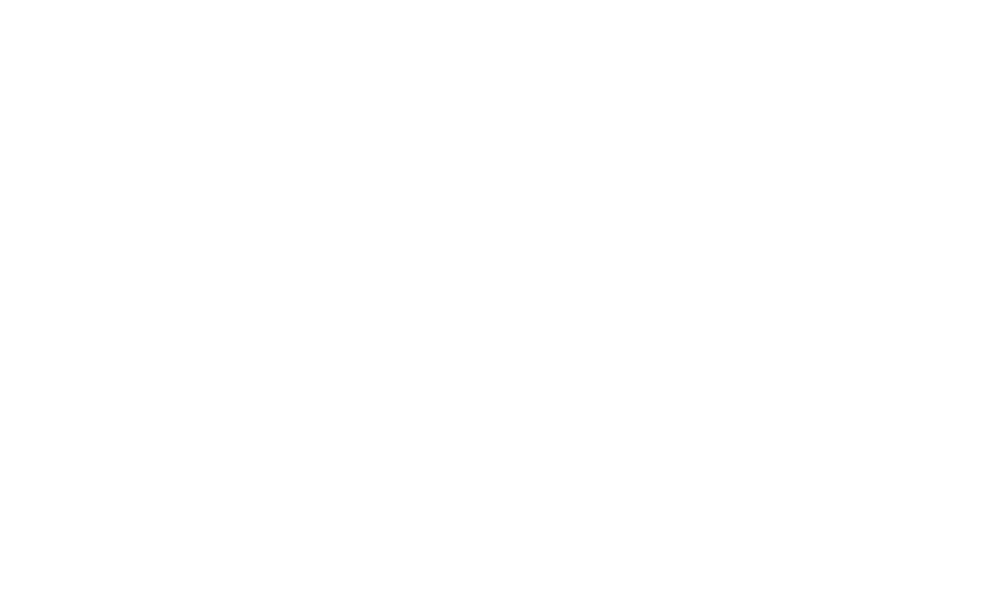

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  0.264509 -129.996023   -1.218121     0.264509     0.264509   
5836  0.264773  -79.824861   50.732323     0.264773     0.264773   
5837  0.265037  -25.459644  100.727392     0.265037     0.265037   
5838  0.265301  -50.422261   73.614776     0.265301     0.265301   
5839  0.265565 -111.960759   15.856931     0.265565     0.265565   

      additive_terms  additive_terms_lower  additive_terms_upper      daily  \
5835      -67.195202            -67.195202            -67.195202 -64.884243   
5836      -14.461155            -14.461155            -14.461155 -12.614001   
5837       38.478080             38.478080             38.478080  39.938632   
5838       13.220833             13.220833             13.220833  14.409543   
5839      -45.977690            -45.977690            -45.977690 -44.921723   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper  \
5835   -64.884243   -64.884243 -2.746636    

<IPython.core.display.Javascript object>


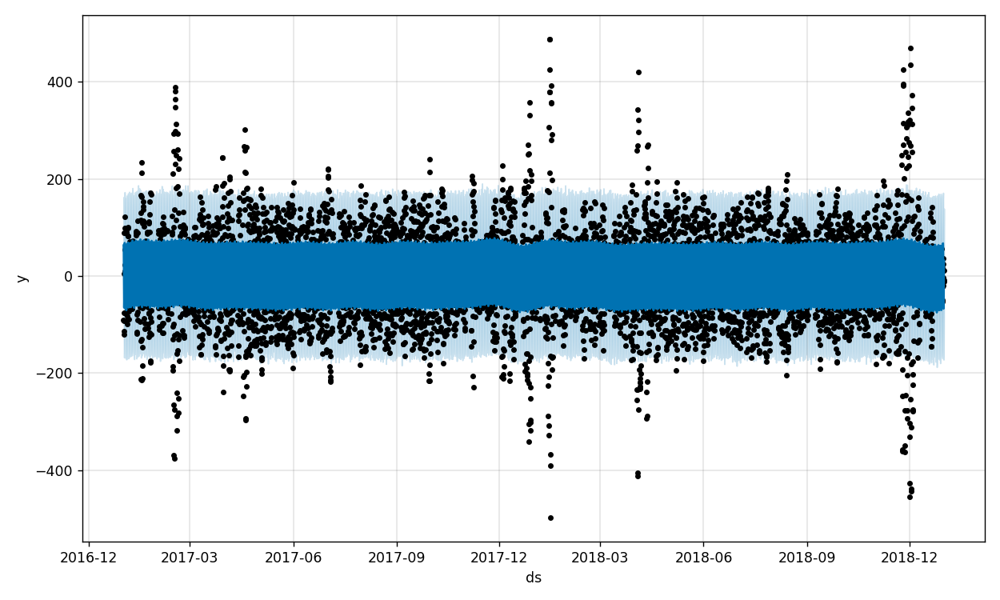

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  0.042350 -137.020090   63.400355     0.042350     0.042350   
5836  0.042090 -172.332086   36.103495     0.042090     0.042090   
5837  0.041830 -165.375861   47.756925     0.041830     0.041830   
5838  0.041571 -117.083497   86.442275     0.041571     0.041571   
5839  0.041311  -64.040543  138.512981     0.041311     0.041311   

      additive_terms  additive_terms_lower  additive_terms_upper      daily  \
5835      -41.279974            -41.279974            -41.279974 -40.623500   
5836      -67.514769            -67.514769            -67.514769 -65.748246   
5837      -56.501071            -56.501071            -56.501071 -53.536336   
5838      -16.972331            -16.972331            -16.972331 -12.829158   
5839       31.381794             31.381794             31.381794  36.574913   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper  \
5835   -40.623500   -40.623500 -2.226123    

<IPython.core.display.Javascript object>


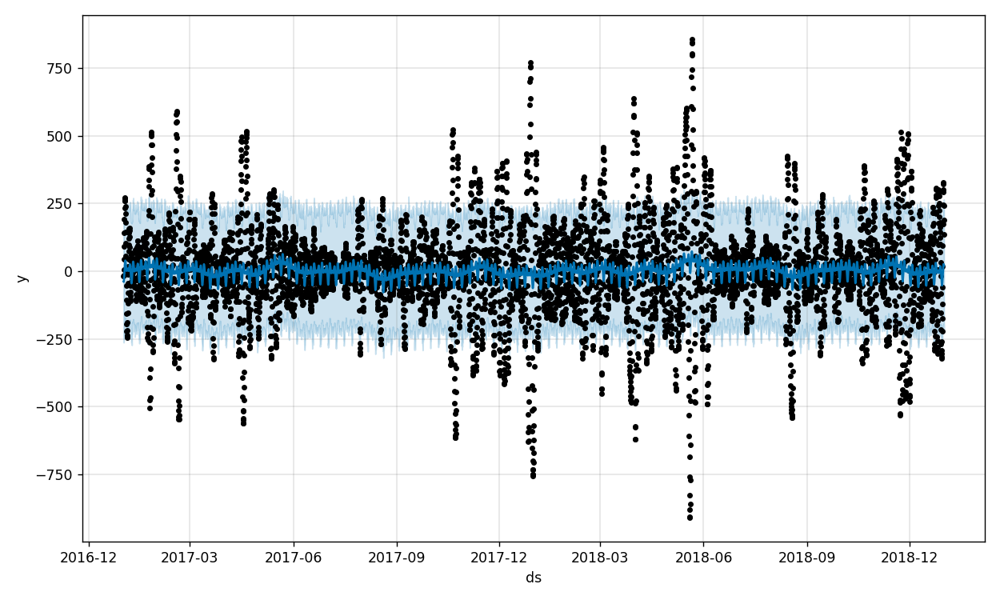

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  8.201086 -196.882250  244.996545     8.201086     8.201086   
5836  8.204076 -213.993512  230.992407     8.204076     8.204076   
5837  8.207065 -198.495142  237.987641     8.207065     8.207065   
5838  8.210055 -196.205995  265.031580     8.210055     8.210055   
5839  8.213045 -213.435430  229.932240     8.213045     8.213045   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835       16.405822             16.405822             16.405822 -0.221780   
5836       18.402317             18.402317             18.402317 -0.571214   
5837       18.220444             18.220444             18.220444 -0.568883   
5838       16.156514             16.156514             16.156514 -0.183931   
5839       12.370438             12.370438             12.370438  0.289804   

      daily_lower  daily_upper     yearly  yearly_lower  yearly_upper  \
5835    -0.221780    -0.221780 -13.502040    -13.

<IPython.core.display.Javascript object>


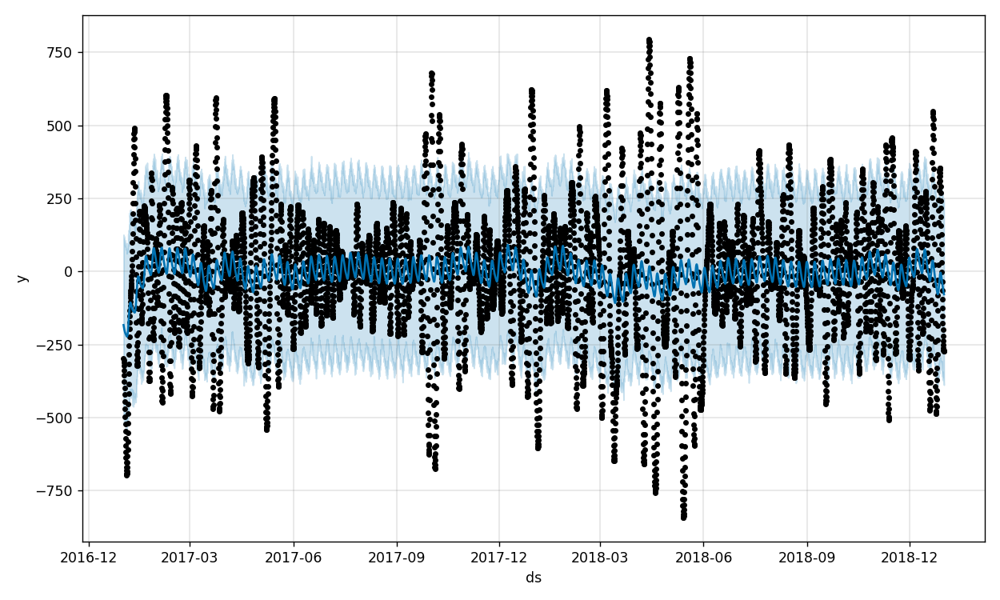

          trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835 -15.694349 -377.103935  241.363197   -15.694349   -15.694349   
5836 -15.698282 -359.294456  247.371925   -15.698282   -15.698282   
5837 -15.702215 -376.477102  224.781668   -15.702215   -15.702215   
5838 -15.706148 -386.004970  249.917359   -15.706148   -15.706148   
5839 -15.710081 -388.658747  228.786995   -15.710081   -15.710081   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835      -53.039912            -53.039912            -53.039912 -0.039860   
5836      -55.511081            -55.511081            -55.511081 -0.043465   
5837      -57.873636            -57.873636            -57.873636 -0.033053   
5838      -60.162721            -60.162721            -60.162721 -0.005652   
5839      -62.455968            -62.455968            -62.455968 -0.003131   

      daily_lower  daily_upper     yearly  yearly_lower  yearly_upper  \
5835    -0.039860    -0.039860 -41.140481  

<IPython.core.display.Javascript object>


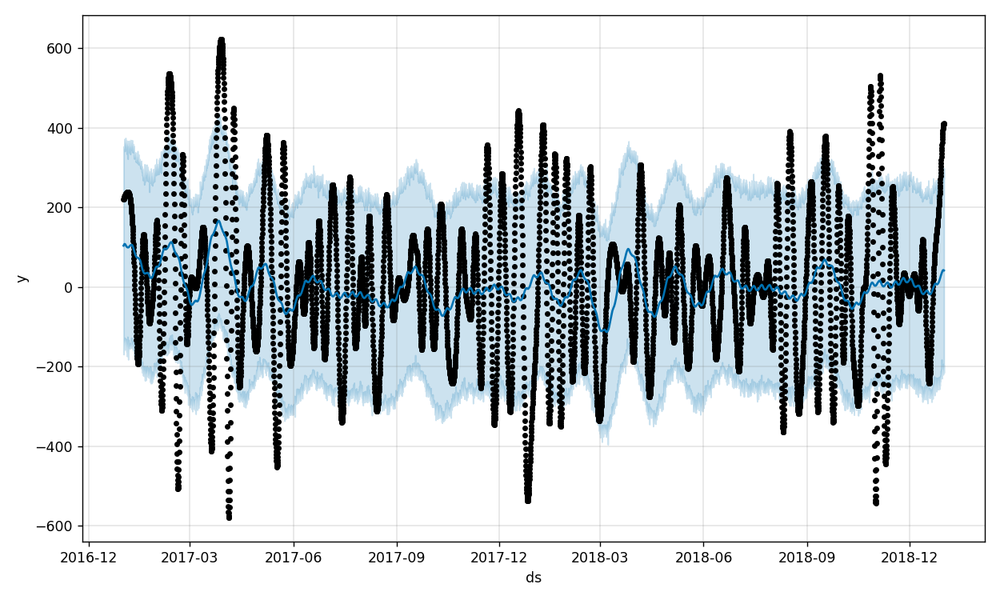

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  6.338858 -214.433145  294.706697     6.338858     6.338858   
5836  6.344869 -193.598068  263.019367     6.344869     6.344869   
5837  6.350880 -206.038567  291.962152     6.350880     6.350880   
5838  6.356891 -196.094901  270.760767     6.356891     6.356891   
5839  6.362903 -216.074955  297.927781     6.362903     6.362903   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835       35.755816             35.755816             35.755816 -0.019931   
5836       35.646707             35.646707             35.646707  0.019710   
5837       35.438289             35.438289             35.438289  0.066898   
5838       35.136738             35.136738             35.136738  0.106423   
5839       34.780930             34.780930             34.780930  0.152274   

      daily_lower  daily_upper     yearly  yearly_lower  yearly_upper  \
5835    -0.019931    -0.019931  30.597463     30.

<IPython.core.display.Javascript object>


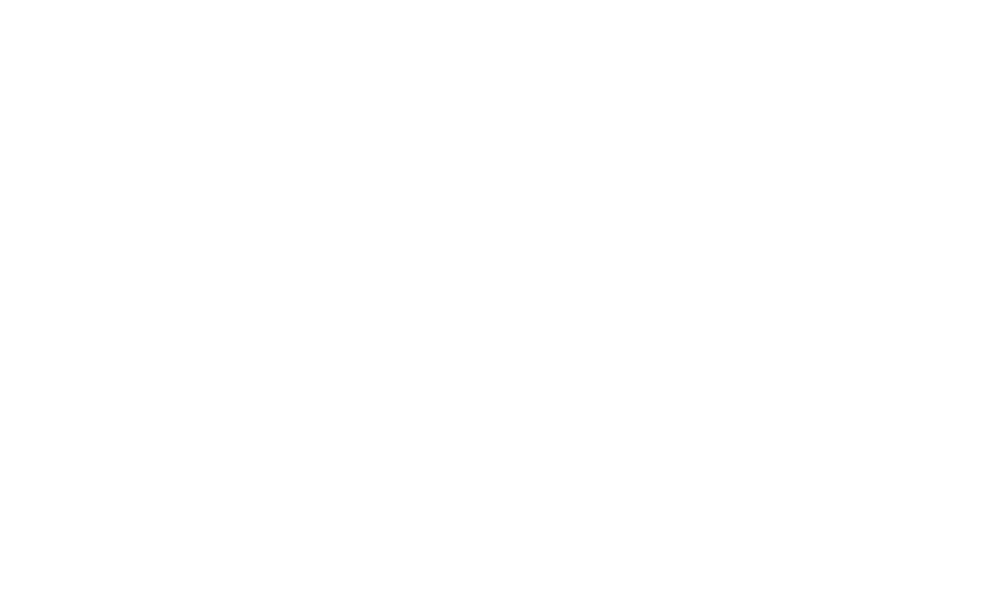

          trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835 -24.424308 -212.548883   85.410297   -24.424308   -24.424308   
5836 -24.431545 -201.742288   96.545207   -24.431545   -24.431545   
5837 -24.438782 -213.477701   86.511815   -24.438782   -24.438782   
5838 -24.446019 -201.862757   81.681250   -24.446019   -24.446019   
5839 -24.453256 -202.400725   89.628531   -24.453256   -24.453256   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835      -34.810098            -34.810098            -34.810098 -0.000953   
5836      -34.392149            -34.392149            -34.392149 -0.015704   
5837      -33.953996            -33.953996            -33.953996 -0.020830   
5838      -33.514563            -33.514563            -33.514563 -0.030537   
5839      -33.069556            -33.069556            -33.069556 -0.034998   

      daily_lower  daily_upper     yearly  yearly_lower  yearly_upper  \
5835    -0.000953    -0.000953 -34.416998  

<IPython.core.display.Javascript object>


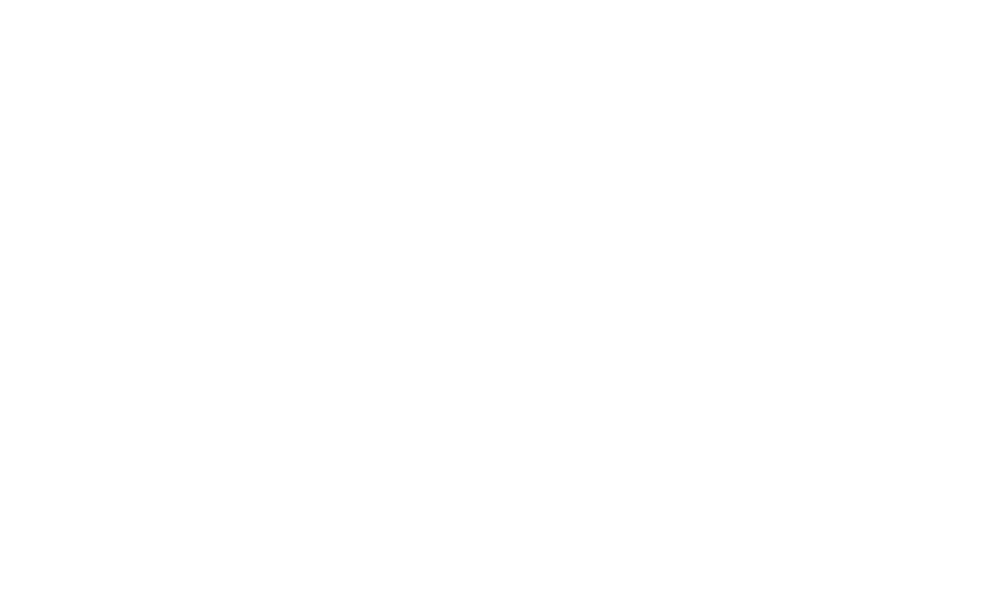

          trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  80.521544   -5.393561  172.589420    80.521544    80.521544   
5836  80.548250   -1.363511  173.154032    80.548250    80.548250   
5837  80.574955   -6.567088  169.817344    80.574955    80.574955   
5838  80.601660  -11.500876  162.058489    80.601660    80.601660   
5839  80.628366  -14.083437  166.159080    80.628366    80.628366   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        5.348817              5.348817              5.348817 -0.021492   
5836        2.555485              2.555485              2.555485  0.015853   
5837       -0.270067             -0.270067             -0.270067  0.050546   
5838       -3.118881             -3.118881             -3.118881  0.089869   
5839       -5.995085             -5.995085             -5.995085  0.125467   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper  \
5835    -0.021492    -0.021492  5.322764    

<IPython.core.display.Javascript object>


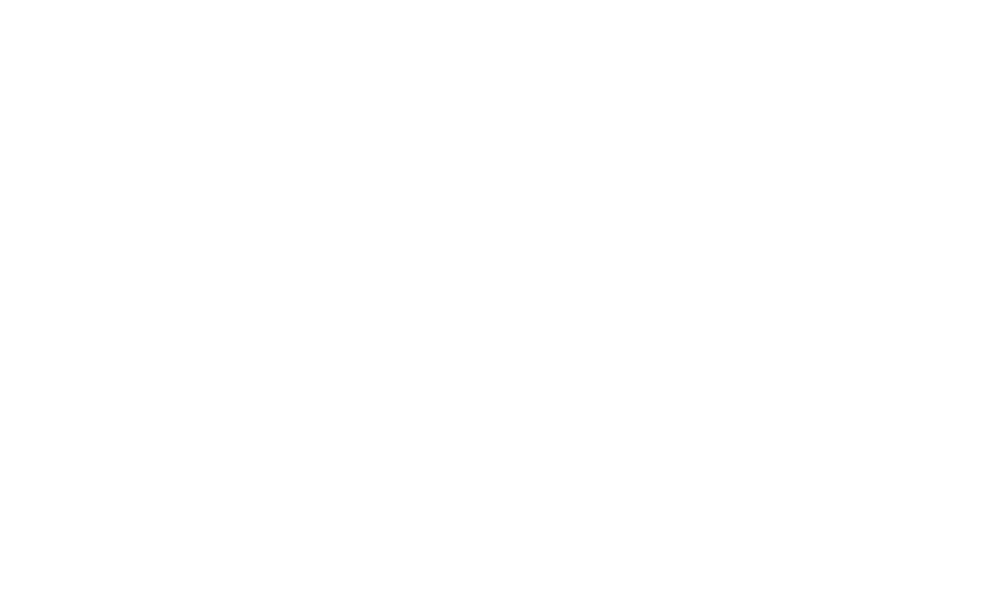

          trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  14.002547  605.670921  647.545904    14.002547    14.002547   
5836  13.997990  604.753488  644.975200    13.997990    13.997990   
5837  13.993434  604.261747  646.204024    13.993434    13.993434   
5838  13.988877  603.561684  646.970367    13.988877    13.988877   
5839  13.984320  601.497493  644.839354    13.984320    13.984320   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835      612.206025            612.206025            612.206025 -0.002391   
5836      611.551255            611.551255            611.551255  0.003772   
5837      610.886954            610.886954            610.886954  0.012151   
5838      610.210198            610.210198            610.210198  0.018383   
5839      609.527284            609.527284            609.527284  0.026801   

      daily_lower  daily_upper      yearly  yearly_lower  yearly_upper  \
5835    -0.002391    -0.002391  611.983049

<IPython.core.display.Javascript object>


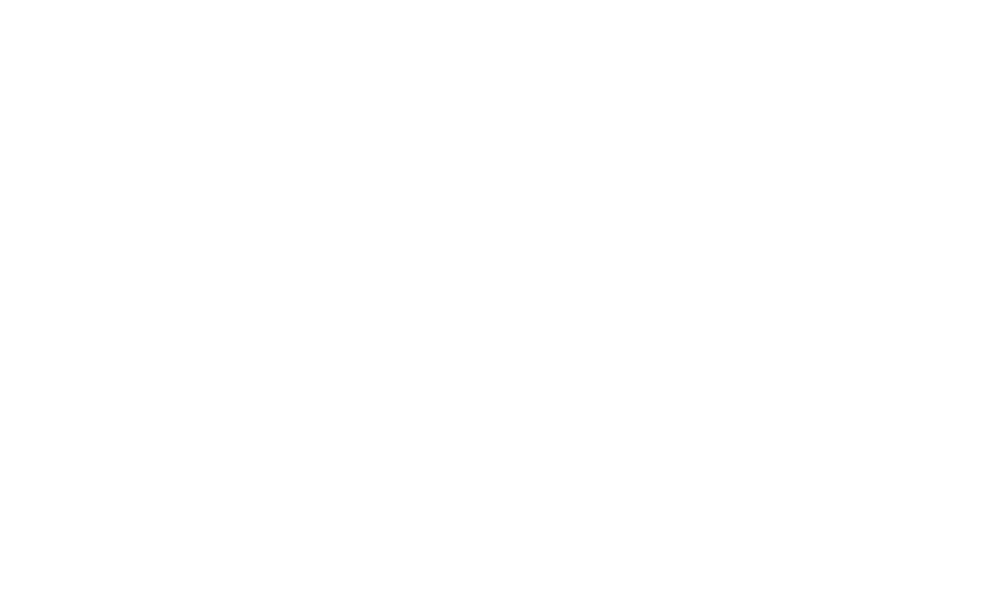

             trend    yhat_lower    yhat_upper   trend_lower   trend_upper  \
5835  85417.028965  85419.511634  85426.168032  85417.028965  85417.028965   
5836  85417.001866  85419.399780  85426.086582  85417.001866  85417.001866   
5837  85416.974767  85419.240254  85425.867848  85416.974767  85416.974767   
5838  85416.947668  85419.077926  85426.052239  85416.947668  85416.947668   
5839  85416.920570  85419.363112  85425.802954  85416.920570  85416.920570   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        5.745453              5.745453              5.745453 -0.001392   
5836        5.688924              5.688924              5.688924  0.001302   
5837        5.629676              5.629676              5.629676  0.003907   
5838        5.568313              5.568313              5.568313  0.006622   
5839        5.505203              5.505203              5.505203  0.009225   

      daily_lower  daily_upper    yearly  yearly_lower  yearly

<IPython.core.display.Javascript object>


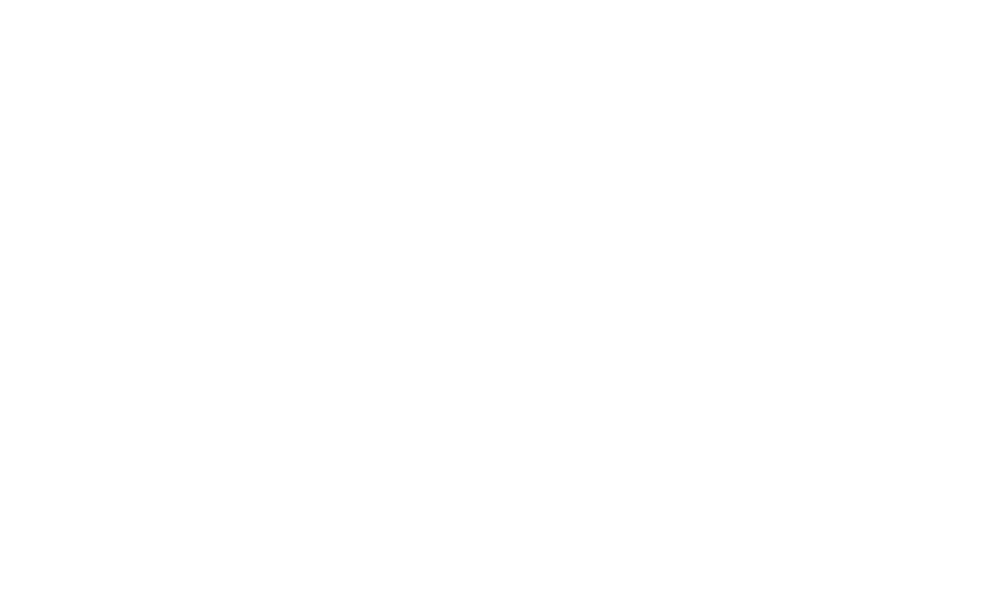

             trend    yhat_lower    yhat_upper   trend_lower   trend_upper  \
5835 -1.647194e-13 -1.065683e-11  1.099033e-11 -1.647194e-13 -1.647194e-13   
5836 -1.647836e-13 -1.169504e-11  1.138511e-11 -1.647836e-13 -1.647836e-13   
5837 -1.648479e-13 -1.205266e-11  1.096851e-11 -1.648479e-13 -1.648479e-13   
5838 -1.649122e-13 -1.290385e-11  1.053785e-11 -1.649122e-13 -1.649122e-13   
5839 -1.649765e-13 -1.187558e-11  1.043696e-11 -1.649765e-13 -1.649765e-13   

      additive_terms  additive_terms_lower  additive_terms_upper  \
5835   -3.322335e-13         -3.322335e-13         -3.322335e-13   
5836   -7.980029e-13         -7.980029e-13         -7.980029e-13   
5837   -9.803330e-13         -9.803330e-13         -9.803330e-13   
5838   -1.377814e-12         -1.377814e-12         -1.377814e-12   
5839   -7.189019e-13         -7.189019e-13         -7.189019e-13   

             daily   daily_lower   daily_upper        yearly  yearly_lower  \
5835  4.470599e-13  4.470599e-13  4.470599e-

<IPython.core.display.Javascript object>


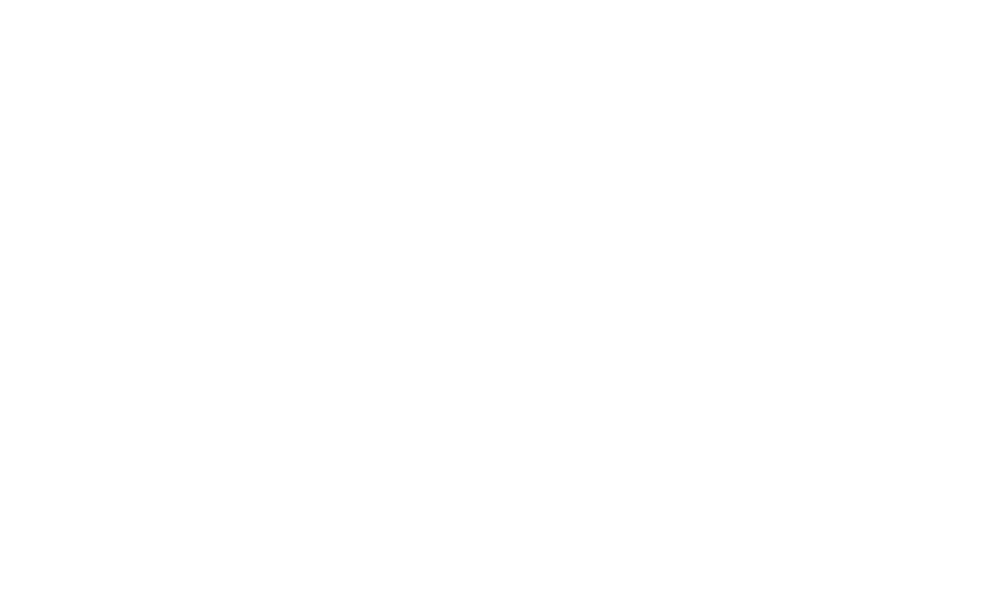

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  4.674397 -107.475585   67.593175     4.674397     4.674397   
5836  4.674196 -227.310142  -53.600090     4.674196     4.674196   
5837  4.673995  -67.112560  111.732009     4.673995     4.673995   
5838  4.673794   -6.481012  171.284279     4.673794     4.673794   
5839  4.673593 -102.869591   72.740972     4.673593     4.673593   

      additive_terms  additive_terms_lower  additive_terms_upper       daily  \
5835      -26.217915            -26.217915            -26.217915  -21.086564   
5836     -148.223446           -148.223446           -148.223446 -142.998583   
5837       15.409541             15.409541             15.409541   20.722112   
5838       78.998680             78.998680             78.998680   84.376775   
5839      -24.840093            -24.840093            -24.840093  -19.434490   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper  \
5835   -21.086564   -21.086564 -4.3613

<IPython.core.display.Javascript object>


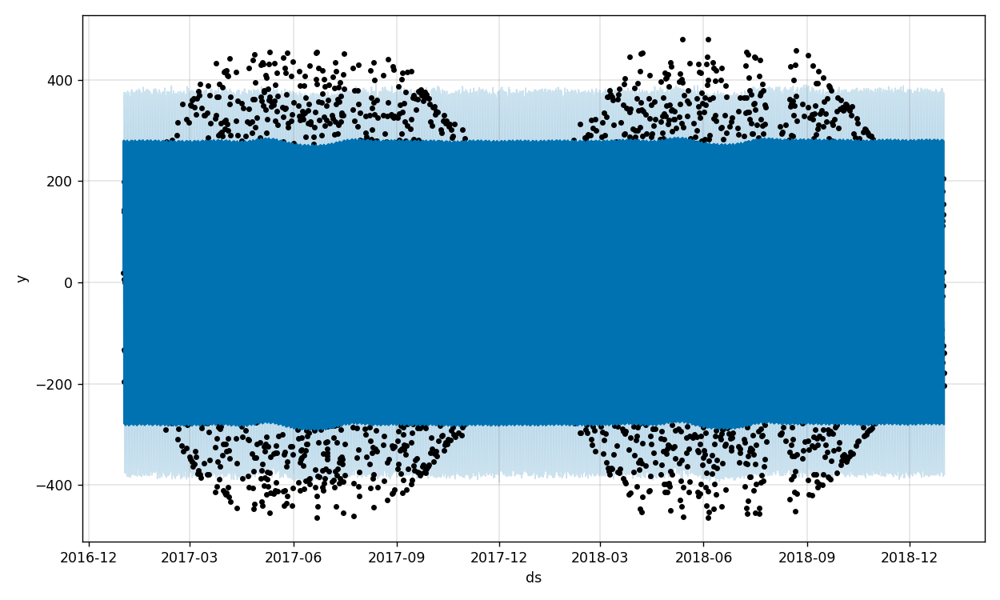

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835 -1.362994   72.351718  269.671696    -1.362994    -1.362994   
5836 -1.362390 -134.076180   67.283368    -1.362390    -1.362390   
5837 -1.361787 -314.091792 -119.434801    -1.361787    -1.361787   
5838 -1.361183 -378.287826 -181.655504    -1.361183    -1.361183   
5839 -1.360580 -275.526331  -75.041196    -1.360580    -1.360580   

      additive_terms  additive_terms_lower  additive_terms_upper       daily  \
5835      173.740211            173.740211            173.740211  174.153154   
5836      -29.868650            -29.868650            -29.868650  -28.990687   
5837     -214.662001           -214.662001           -214.662001 -213.375925   
5838     -278.666057           -278.666057           -278.666057 -277.062987   
5839     -174.958986           -174.958986           -174.958986 -173.158058   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper  \
5835   174.153154   174.153154 -0.1276

<IPython.core.display.Javascript object>


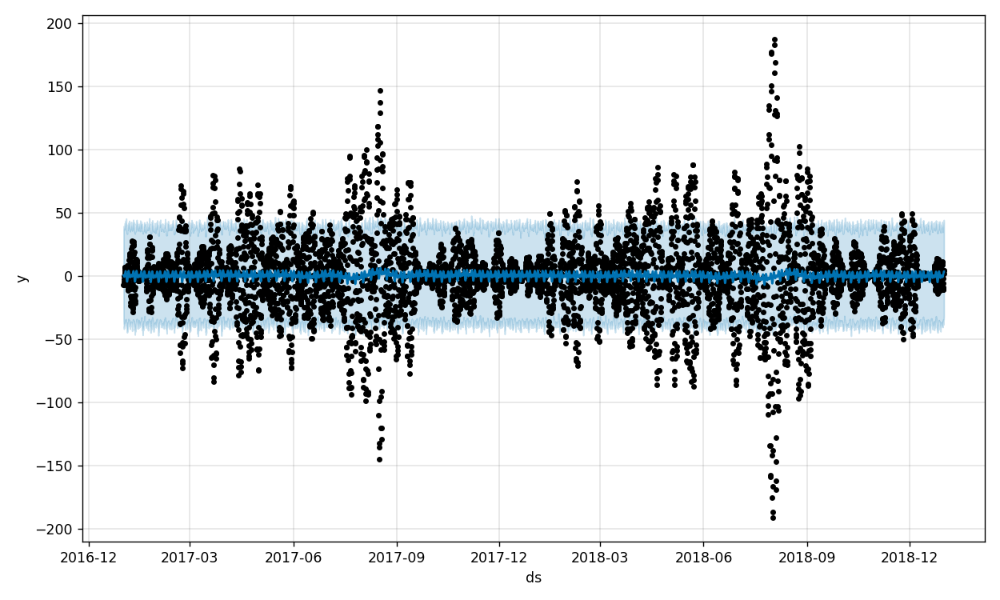

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835 -0.312339  -38.733865   39.884604    -0.312339    -0.312339   
5836 -0.312512  -35.402562   38.154455    -0.312512    -0.312512   
5837 -0.312685  -34.903227   39.710570    -0.312685    -0.312685   
5838 -0.312858  -34.755278   44.118291    -0.312858    -0.312858   
5839 -0.313032  -31.656963   41.464084    -0.313032    -0.313032   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        2.150303              2.150303              2.150303  0.005641   
5836        2.811882              2.811882              2.811882 -0.000920   
5837        3.325295              3.325295              3.325295 -0.002631   
5838        3.601067              3.601067              3.601067 -0.016526   
5839        3.612235              3.612235              3.612235 -0.016025   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     0.005641     0.005641  0.191513 

<IPython.core.display.Javascript object>


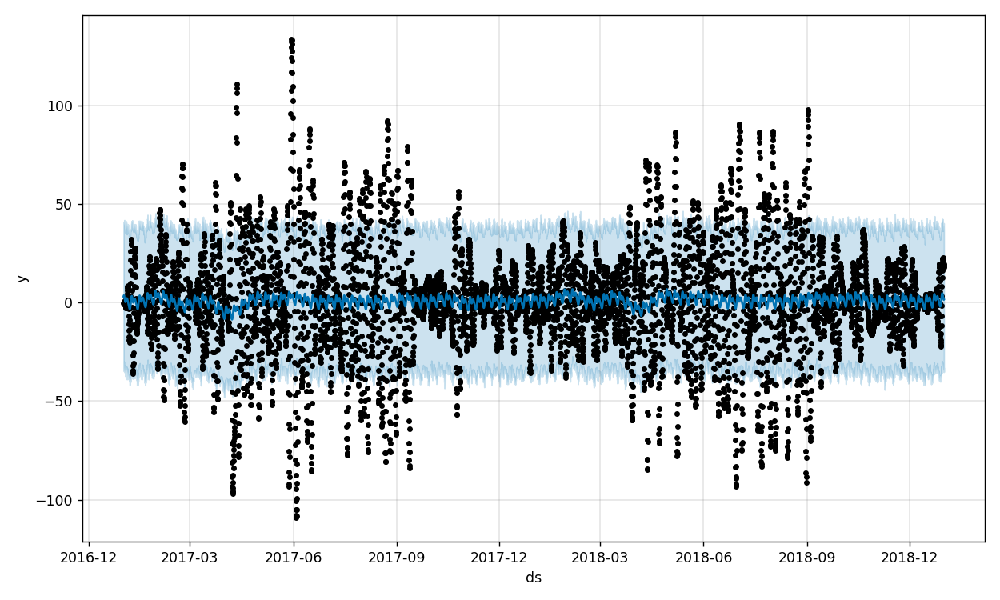

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  1.486702  -33.790961   36.881498     1.486702     1.486702   
5836  1.486811  -35.187267   39.451393     1.486811     1.486811   
5837  1.486920  -34.934617   39.052343     1.486920     1.486920   
5838  1.487029  -32.920510   40.359416     1.487029     1.487029   
5839  1.487138  -35.160899   36.734555     1.487138     1.487138   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        0.393330              0.393330              0.393330  0.002670   
5836        0.152898              0.152898              0.152898  0.000594   
5837        0.029315              0.029315              0.029315 -0.003188   
5838        0.029625              0.029625              0.029625 -0.002991   
5839        0.151177              0.151177              0.151177  0.007989   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     0.002670     0.002670  0.242924 

<IPython.core.display.Javascript object>


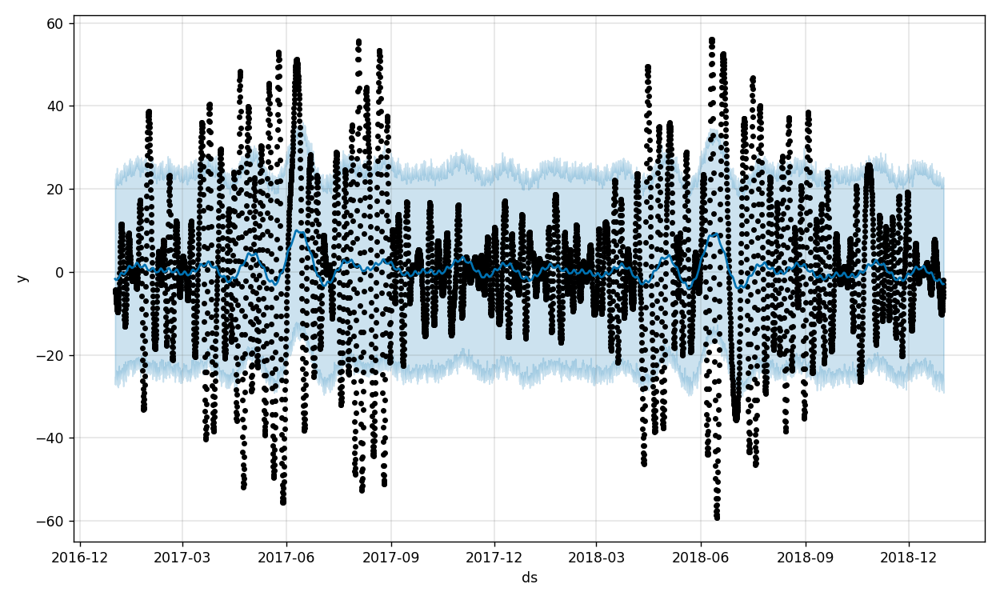

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835 -0.093468  -26.289674   21.699177    -0.093468    -0.093468   
5836 -0.093735  -25.706500   22.854439    -0.093735    -0.093735   
5837 -0.094001  -26.631647   22.885492    -0.094001    -0.094001   
5838 -0.094268  -29.099389   20.692617    -0.094268    -0.094268   
5839 -0.094534  -25.295372   20.868633    -0.094534    -0.094534   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835       -2.863843             -2.863843             -2.863843 -0.001858   
5836       -2.851893             -2.851893             -2.851893  0.001701   
5837       -2.836163             -2.836163             -2.836163  0.004240   
5838       -2.818900             -2.818900             -2.818900  0.004941   
5839       -2.801255             -2.801255             -2.801255  0.004061   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835    -0.001858    -0.001858 -2.454822 

<IPython.core.display.Javascript object>


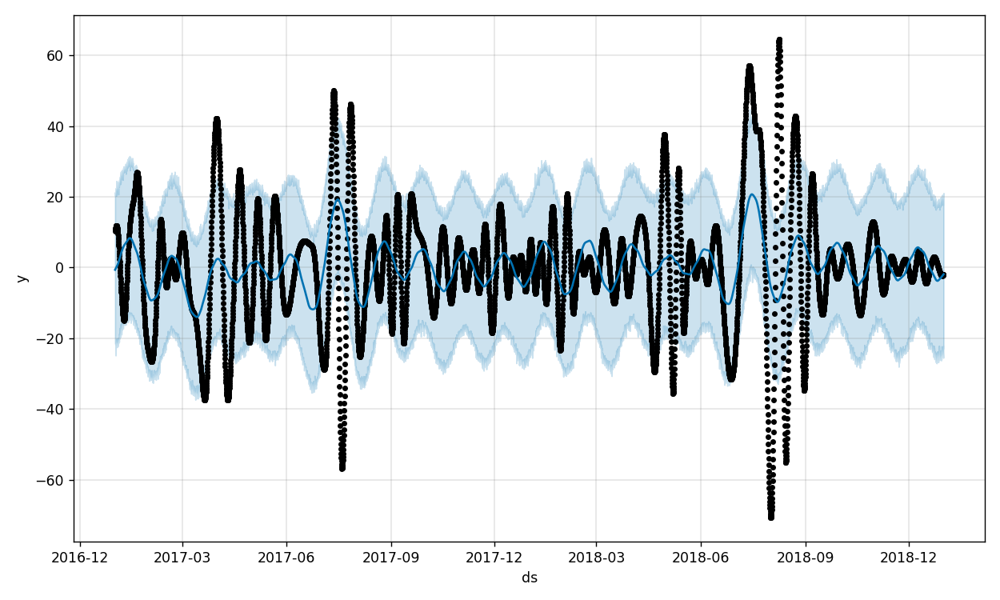

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  2.147886  -24.082285   17.723728     2.147886     2.147886   
5836  2.148451  -24.788802   19.683611     2.148451     2.148451   
5837  2.149016  -25.495521   18.888936     2.149016     2.149016   
5838  2.149581  -22.192060   20.035361     2.149581     2.149581   
5839  2.150146  -22.767072   21.052781     2.150146     2.150146   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835       -4.252429             -4.252429             -4.252429  0.000777   
5836       -4.202150             -4.202150             -4.202150 -0.000640   
5837       -4.150034             -4.150034             -4.150034 -0.002933   
5838       -4.093756             -4.093756             -4.093756 -0.004413   
5839       -4.034506             -4.034506             -4.034506 -0.006804   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     0.000777     0.000777 -4.234936 

<IPython.core.display.Javascript object>


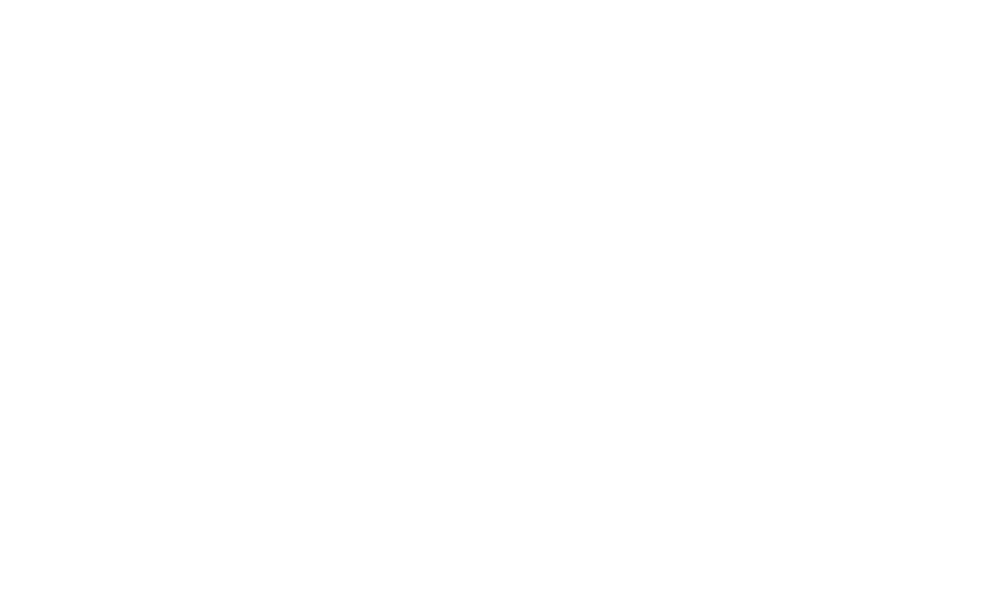

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  0.270200   -5.314040   17.114410     0.270200     0.270200   
5836  0.270503   -5.681779   16.760045     0.270503     0.270503   
5837  0.270806   -5.802662   16.556864     0.270806     0.270806   
5838  0.271110   -4.730331   17.409388     0.271110     0.271110   
5839  0.271413   -6.161841   17.177650     0.271413     0.271413   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        5.116698              5.116698              5.116698  0.000403   
5836        5.158782              5.158782              5.158782 -0.000618   
5837        5.200931              5.200931              5.200931 -0.001185   
5838        5.241705              5.241705              5.241705 -0.002021   
5839        5.281014              5.281014              5.281014 -0.002459   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     0.000403     0.000403  5.194781 

<IPython.core.display.Javascript object>


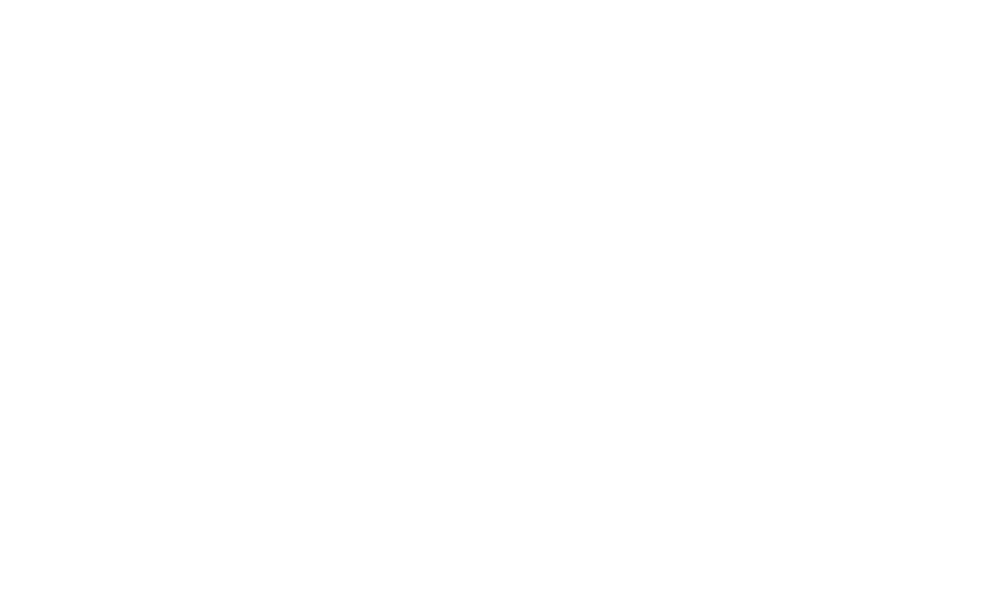

          trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835 -39.353871 -129.129206  -49.830556   -39.353871   -39.353871   
5836 -39.369122 -126.969840  -50.860522   -39.369122   -39.369122   
5837 -39.384372 -126.850144  -51.116477   -39.384372   -39.384372   
5838 -39.399623 -130.275133  -52.827881   -39.399623   -39.399623   
5839 -39.414873 -128.672661  -51.140218   -39.414873   -39.414873   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835      -49.471056            -49.471056            -49.471056 -0.009821   
5836      -49.971702            -49.971702            -49.971702  0.009160   
5837      -50.491186            -50.491186            -50.491186  0.028332   
5838      -51.026451            -51.026451            -51.026451  0.047523   
5839      -51.572824            -51.572824            -51.572824  0.066840   

      daily_lower  daily_upper     yearly  yearly_lower  yearly_upper  \
5835    -0.009821    -0.009821 -49.786457  

<IPython.core.display.Javascript object>


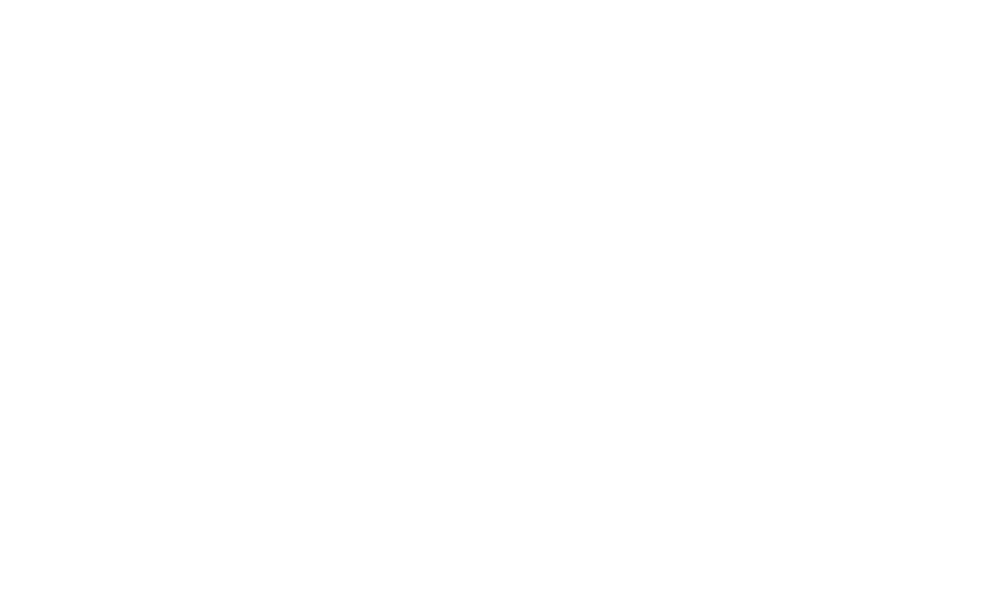

          trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  50.981715  -34.140358   35.953923    50.981715    50.981715   
5836  51.006937  -35.224331   32.419912    51.006937    51.006937   
5837  51.032159  -34.108542   34.288625    51.032159    51.032159   
5838  51.057382  -33.206444   35.679555    51.057382    51.057382   
5839  51.082604  -31.561592   36.432463    51.082604    51.082604   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835      -51.337298            -51.337298            -51.337298  0.009811   
5836      -50.840333            -50.840333            -50.840333 -0.009106   
5837      -50.325571            -50.325571            -50.325571 -0.027892   
5838      -49.796303            -49.796303            -49.796303 -0.047013   
5839      -49.256129            -49.256129            -49.256129 -0.065922   

      daily_lower  daily_upper     yearly  yearly_lower  yearly_upper  \
5835     0.009811     0.009811 -51.064908  

<IPython.core.display.Javascript object>


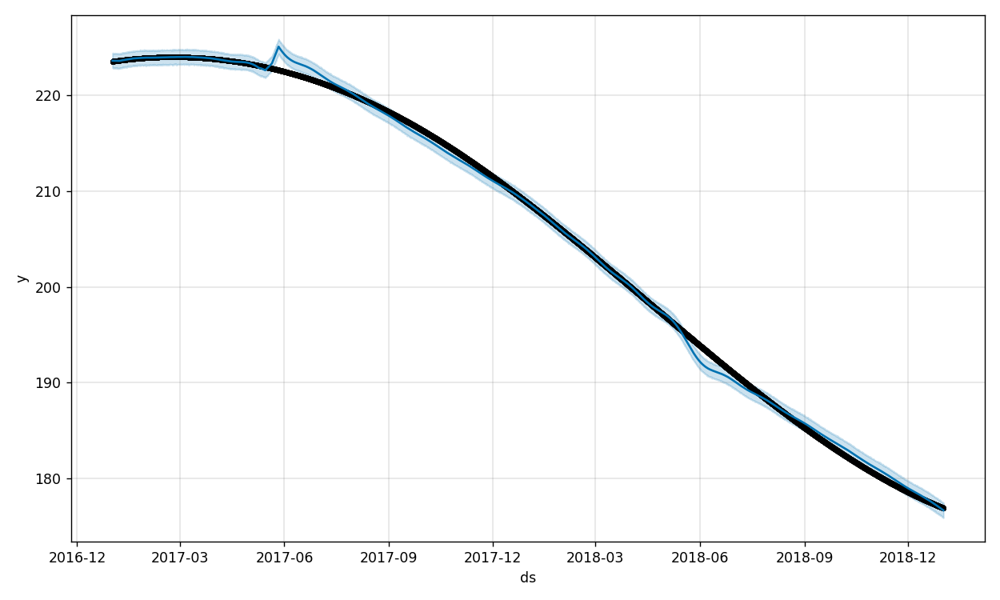

           trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  175.520192  176.016229  177.512861   175.520192   175.520192   
5836  175.509218  175.949153  177.497480   175.509218   175.509218   
5837  175.498243  175.939205  177.534797   175.498243   175.498243   
5838  175.487268  175.952278  177.456585   175.487268   175.487268   
5839  175.476294  175.929910  177.484947   175.476294   175.476294   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        1.227228              1.227228              1.227228 -0.000001   
5836        1.227327              1.227327              1.227327  0.000060   
5837        1.227295              1.227295              1.227295  0.000060   
5838        1.227251              1.227251              1.227251  0.000113   
5839        1.227094              1.227094              1.227094  0.000112   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper  \
5835    -0.000001    -0.000001  1.2244

<IPython.core.display.Javascript object>


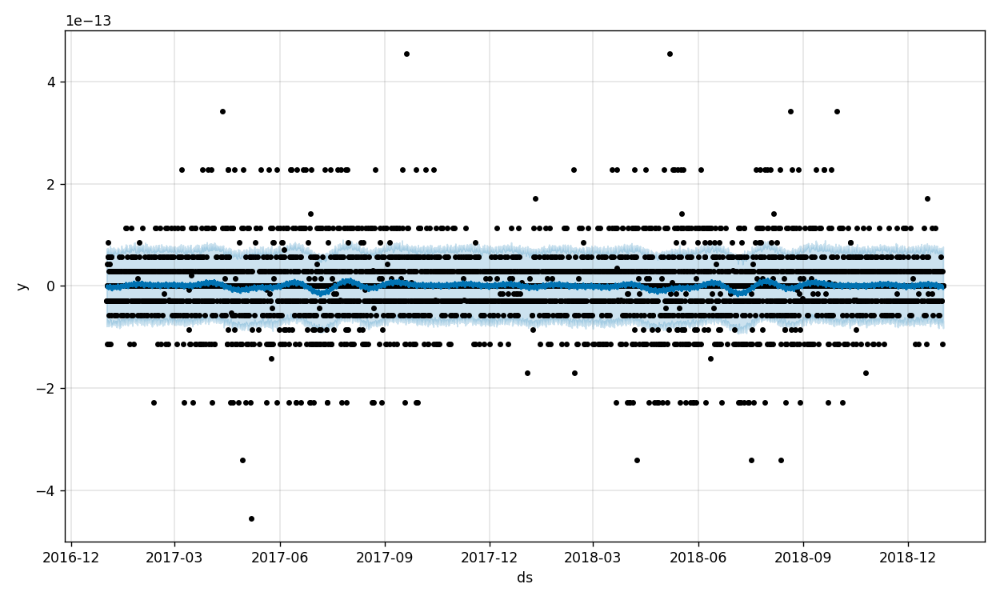

             trend    yhat_lower    yhat_upper   trend_lower   trend_upper  \
5835 -9.241364e-16 -7.097518e-14  6.208601e-14 -9.241364e-16 -9.241364e-16   
5836 -9.243397e-16 -7.244787e-14  6.932094e-14 -9.243397e-16 -9.243397e-16   
5837 -9.245430e-16 -7.453204e-14  6.409982e-14 -9.245430e-16 -9.245430e-16   
5838 -9.247463e-16 -6.812901e-14  7.676942e-14 -9.247463e-16 -9.247463e-16   
5839 -9.249496e-16 -8.253928e-14  6.167092e-14 -9.249496e-16 -9.249496e-16   

      additive_terms  additive_terms_lower  additive_terms_upper  \
5835   -7.911823e-16         -7.911823e-16         -7.911823e-16   
5836   -1.213052e-15         -1.213052e-15         -1.213052e-15   
5837   -2.610699e-15         -2.610699e-15         -2.610699e-15   
5838    6.577891e-16          6.577891e-16          6.577891e-16   
5839   -4.997765e-15         -4.997765e-15         -4.997765e-15   

             daily   daily_lower   daily_upper        yearly  yearly_lower  \
5835  3.801557e-16  3.801557e-16  3.801557e-

<IPython.core.display.Javascript object>


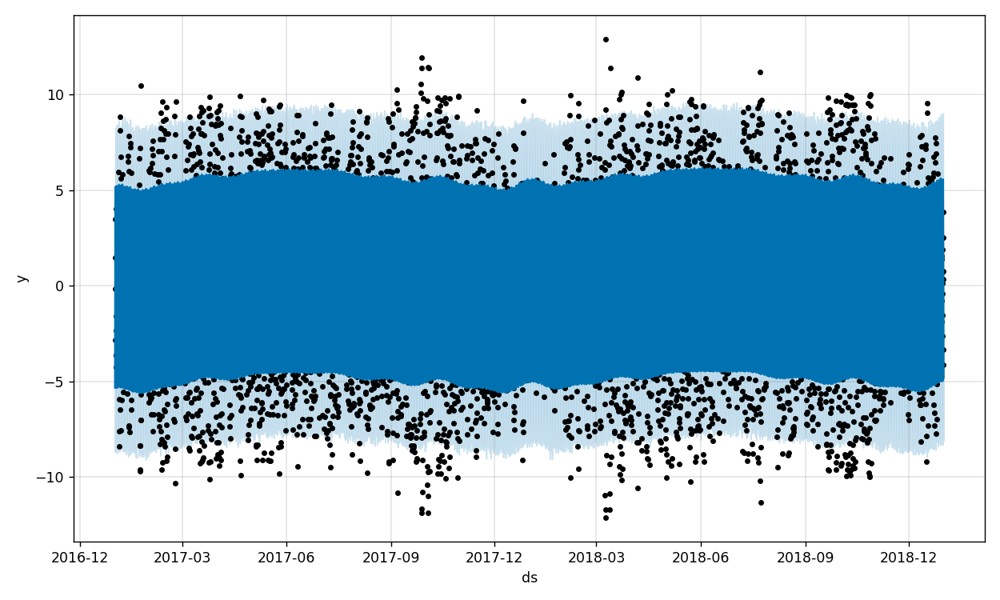

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  0.117938    2.348701    9.014856     0.117938     0.117938   
5836  0.117960   -0.904274    5.478012     0.117960     0.117960   
5837  0.117981   -3.653255    2.528192     0.117981     0.117981   
5838  0.118003   -6.282816    0.119367     0.118003     0.118003   
5839  0.118025   -8.113190   -1.350064     0.118025     0.118025   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        5.438355              5.438355              5.438355  5.547197   
5836        2.189863              2.189863              2.189863  2.298043   
5837       -0.743849             -0.743849             -0.743849 -0.632972   
5838       -3.245626             -3.245626             -3.245626 -3.129287   
5839       -4.938979             -4.938979             -4.938979 -4.815413   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     5.547197     5.547197 -0.095969 

<IPython.core.display.Javascript object>


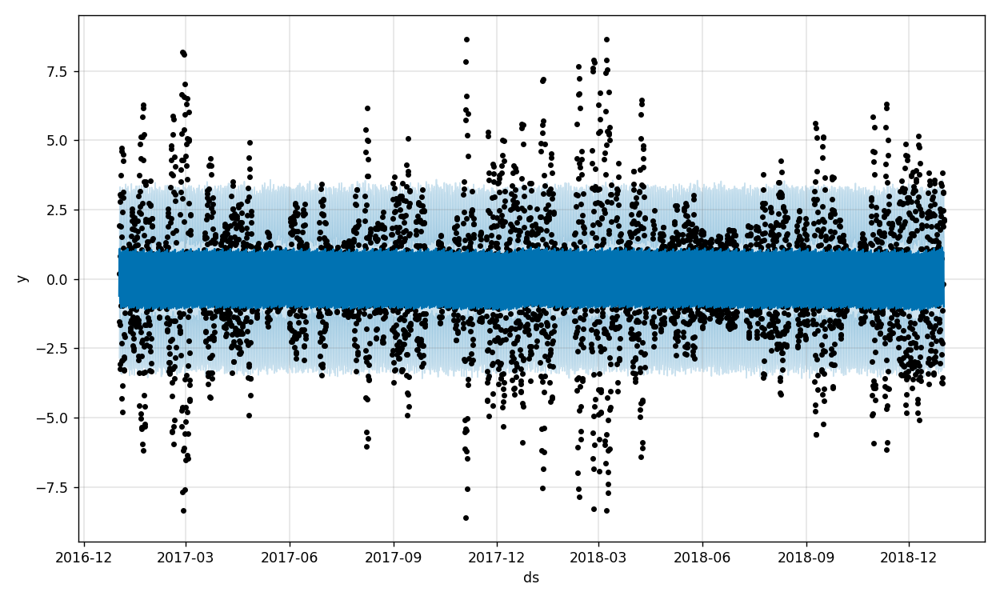

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  0.004890   -1.226144    3.253180     0.004890     0.004890   
5836  0.004889   -1.865995    2.908511     0.004889     0.004889   
5837  0.004889   -2.406979    2.224495     0.004889     0.004889   
5838  0.004889   -3.031774    1.503306     0.004889     0.004889   
5839  0.004889   -3.184997    1.577064     0.004889     0.004889   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        0.964111              0.964111              0.964111  0.956234   
5836        0.568982              0.568982              0.568982  0.586152   
5837       -0.102609             -0.102609             -0.102609 -0.069312   
5838       -0.724580             -0.724580             -0.724580 -0.685498   
5839       -1.002385             -1.002385             -1.002385 -0.968144   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     0.956234     0.956234  0.058905 

<IPython.core.display.Javascript object>


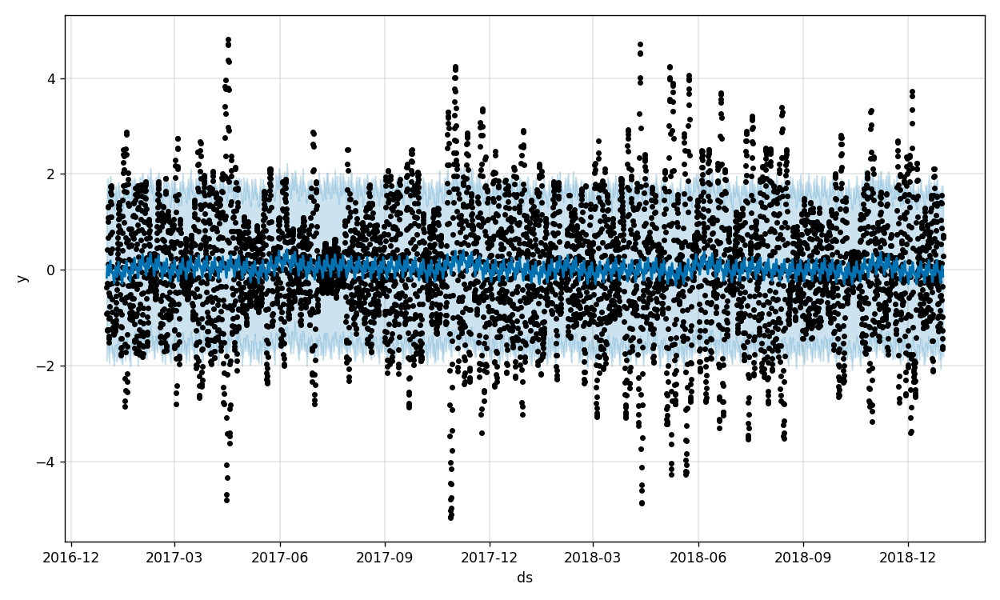

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835 -0.024655   -1.755199    1.534915    -0.024655    -0.024655   
5836 -0.024672   -1.634255    1.541750    -0.024672    -0.024672   
5837 -0.024689   -1.758562    1.423415    -0.024689    -0.024689   
5838 -0.024707   -1.749036    1.551384    -0.024707    -0.024707   
5839 -0.024724   -1.807603    1.384369    -0.024724    -0.024724   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        0.034787              0.034787              0.034787  0.011861   
5836       -0.008753             -0.008753             -0.008753  0.008205   
5837       -0.054070             -0.054070             -0.054070  0.000431   
5838       -0.092821             -0.092821             -0.092821 -0.007519   
5839       -0.117225             -0.117225             -0.117225 -0.011498   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     0.011861     0.011861 -0.024530 

<IPython.core.display.Javascript object>


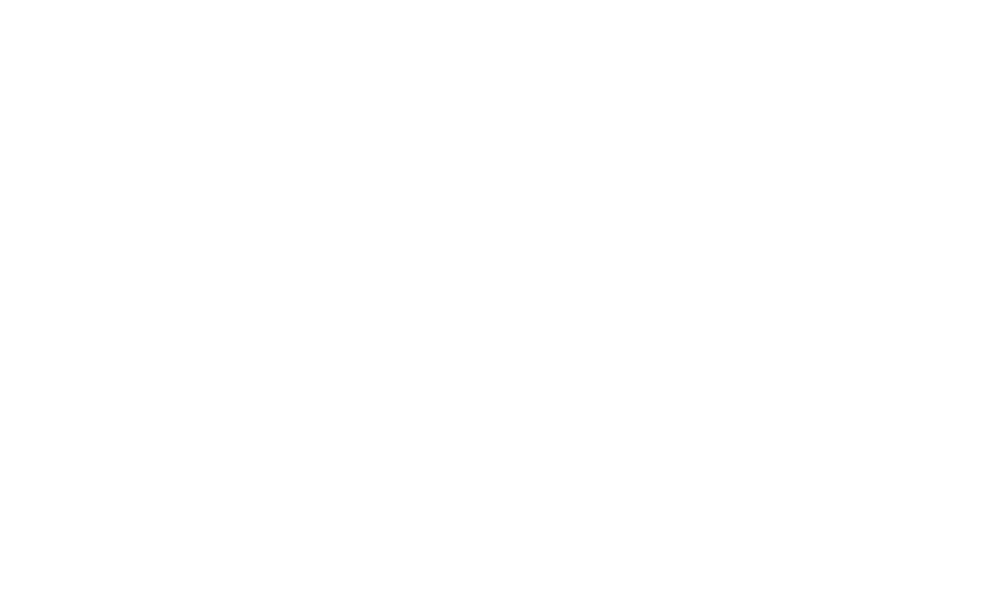

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  0.046319   -1.531030    2.312496     0.046319     0.046319   
5836  0.046336   -1.507341    2.159701     0.046336     0.046336   
5837  0.046354   -1.471648    2.383834     0.046354     0.046354   
5838  0.046372   -1.724682    2.171338     0.046372     0.046372   
5839  0.046389   -1.603346    2.247758     0.046389     0.046389   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        0.384817              0.384817              0.384817 -0.000355   
5836        0.361583              0.361583              0.361583  0.000170   
5837        0.336032              0.336032              0.336032  0.000806   
5838        0.308907              0.308907              0.308907  0.001495   
5839        0.280916              0.280916              0.280916  0.002123   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835    -0.000355    -0.000355  0.130695 

<IPython.core.display.Javascript object>


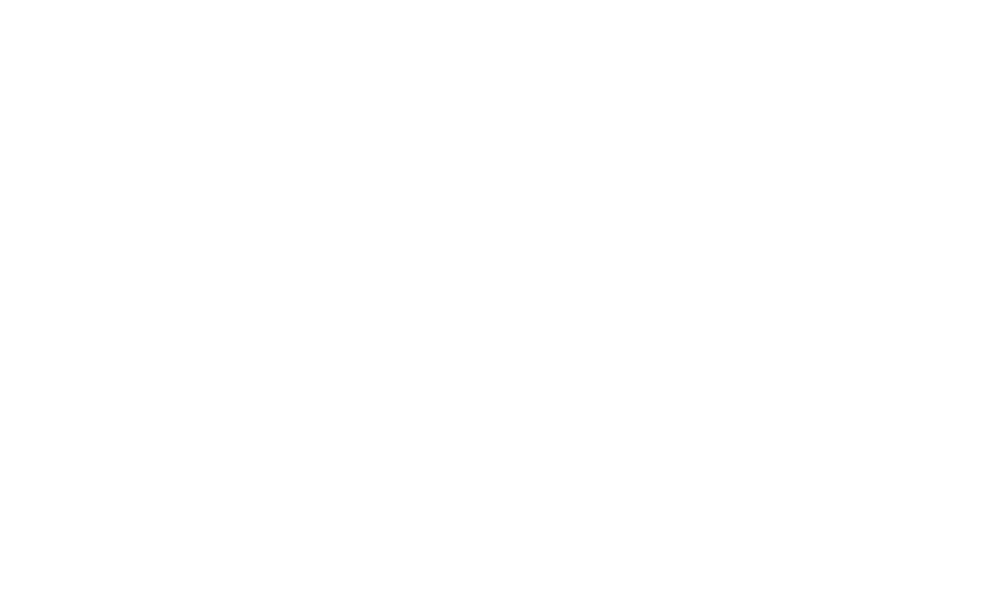

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  0.163796   -2.033678    3.609240     0.163796     0.163796   
5836  0.163819   -1.956489    3.832049     0.163819     0.163819   
5837  0.163842   -1.977233    3.531655     0.163842     0.163842   
5838  0.163866   -1.917318    3.847072     0.163866     0.163866   
5839  0.163889   -1.919261    3.671431     0.163889     0.163889   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        0.661466              0.661466              0.661466  0.000654   
5836        0.660203              0.660203              0.660203 -0.000564   
5837        0.659717              0.659717              0.659717 -0.001776   
5838        0.659720              0.659720              0.659720 -0.003051   
5839        0.660028              0.660028              0.660028 -0.004272   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     0.000654     0.000654  0.647346 

<IPython.core.display.Javascript object>


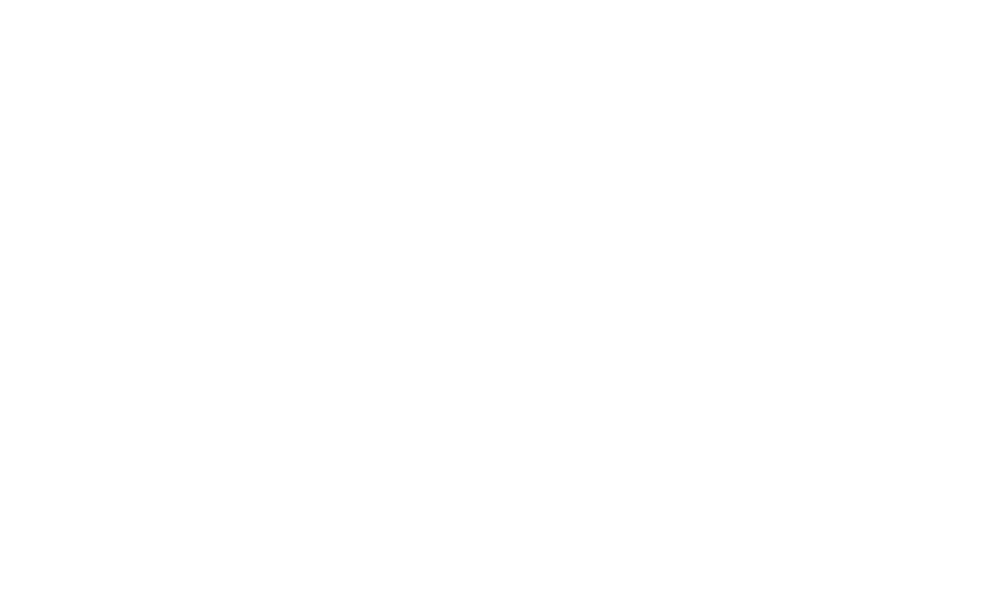

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835 -0.262296   -1.923006    0.629047    -0.262296    -0.262296   
5836 -0.262365   -1.924322    0.702383    -0.262365    -0.262365   
5837 -0.262435   -1.885088    0.774224    -0.262435    -0.262435   
5838 -0.262504   -1.921032    0.645646    -0.262504    -0.262504   
5839 -0.262573   -1.820659    0.770143    -0.262573    -0.262573   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835       -0.391210             -0.391210             -0.391210  0.000128   
5836       -0.371750             -0.371750             -0.371750 -0.000126   
5837       -0.352074             -0.352074             -0.352074 -0.000376   
5838       -0.332225             -0.332225             -0.332225 -0.000637   
5839       -0.312234             -0.312234             -0.312234 -0.000893   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     0.000128     0.000128 -0.390796 

<IPython.core.display.Javascript object>


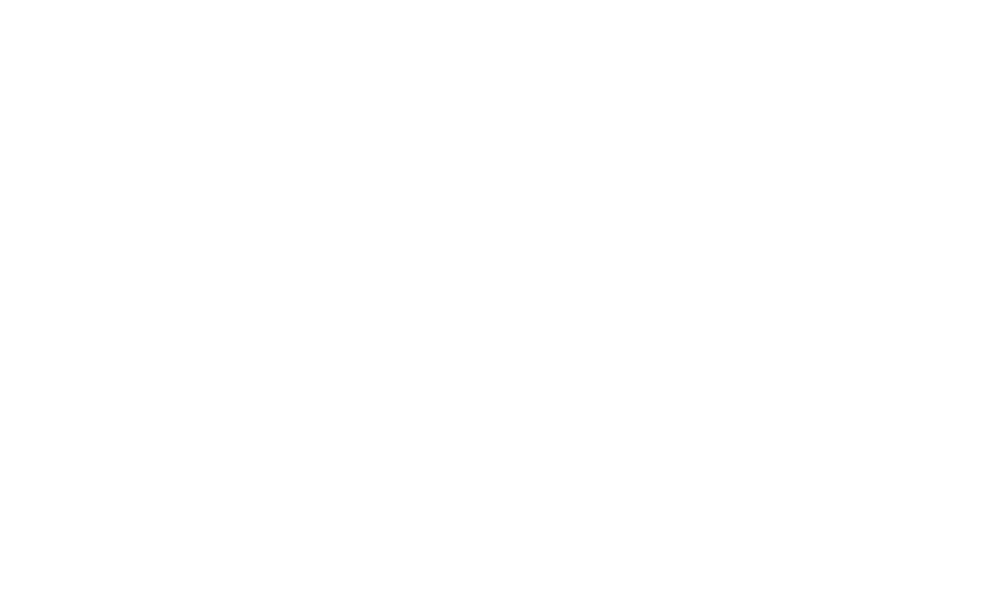

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  3.130143  -17.162882  -15.086616     3.130143     3.130143   
5836  3.130106  -17.100874  -14.999748     3.130106     3.130106   
5837  3.130068  -17.145720  -15.138689     3.130068     3.130068   
5838  3.130031  -17.191396  -15.140716     3.130031     3.130031   
5839  3.129993  -17.239554  -15.007782     3.129993     3.129993   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835      -19.264563            -19.264563            -19.264563  0.000198   
5836      -19.265897            -19.265897            -19.265897 -0.000242   
5837      -19.266963            -19.266963            -19.266963 -0.000750   
5838      -19.267703            -19.267703            -19.267703 -0.001173   
5839      -19.268406            -19.268406            -19.268406 -0.001674   

      daily_lower  daily_upper     yearly  yearly_lower  yearly_upper  \
5835     0.000198     0.000198 -19.256875    -19.

<IPython.core.display.Javascript object>


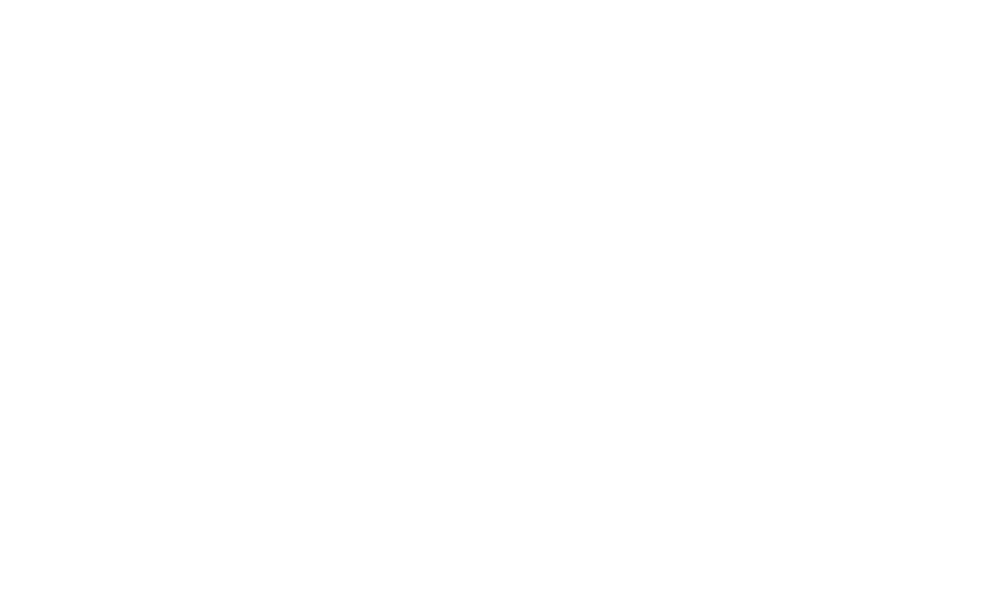

           trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  276.903407  276.781165  277.149372   276.903407   276.903407   
5836  276.902926  276.783803  277.135314   276.902926   276.902926   
5837  276.902445  276.769487  277.137841   276.902445   276.902445   
5838  276.901965  276.778268  277.119786   276.901965   276.901965   
5839  276.901484  276.769405  277.128564   276.901484   276.901484   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        0.056366              0.056366              0.056366 -0.000053   
5836        0.054077              0.054077              0.054077  0.000040   
5837        0.051688              0.051688              0.051688  0.000125   
5838        0.049234              0.049234              0.049234  0.000221   
5839        0.046716              0.046716              0.046716  0.000307   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper  \
5835    -0.000053    -0.000053  0.0549

<IPython.core.display.Javascript object>


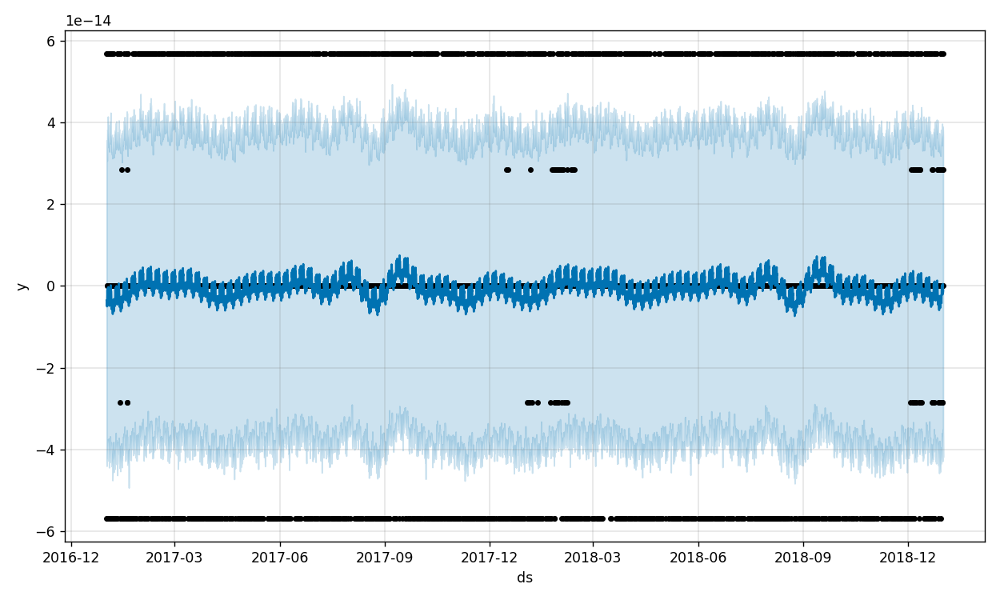

             trend    yhat_lower    yhat_upper   trend_lower   trend_upper  \
5835 -1.275577e-16 -4.282518e-14  3.625530e-14 -1.275577e-16 -1.275577e-16   
5836 -1.275704e-16 -3.871079e-14  3.894245e-14 -1.275704e-16 -1.275704e-16   
5837 -1.275832e-16 -3.508071e-14  3.884763e-14 -1.275832e-16 -1.275832e-16   
5838 -1.275959e-16 -3.678867e-14  3.799326e-14 -1.275959e-16 -1.275959e-16   
5839 -1.276086e-16 -4.183990e-14  3.651550e-14 -1.276086e-16 -1.276086e-16   

      additive_terms  additive_terms_lower  additive_terms_upper  \
5835   -1.967601e-15         -1.967601e-15         -1.967601e-15   
5836    6.086810e-17          6.086810e-17          6.086810e-17   
5837    6.152484e-16          6.152484e-16          6.152484e-16   
5838   -1.465846e-15         -1.465846e-15         -1.465846e-15   
5839   -8.976456e-16         -8.976456e-16         -8.976456e-16   

             daily   daily_lower   daily_upper        yearly  yearly_lower  \
5835 -1.769182e-15 -1.769182e-15 -1.769182e-

<IPython.core.display.Javascript object>


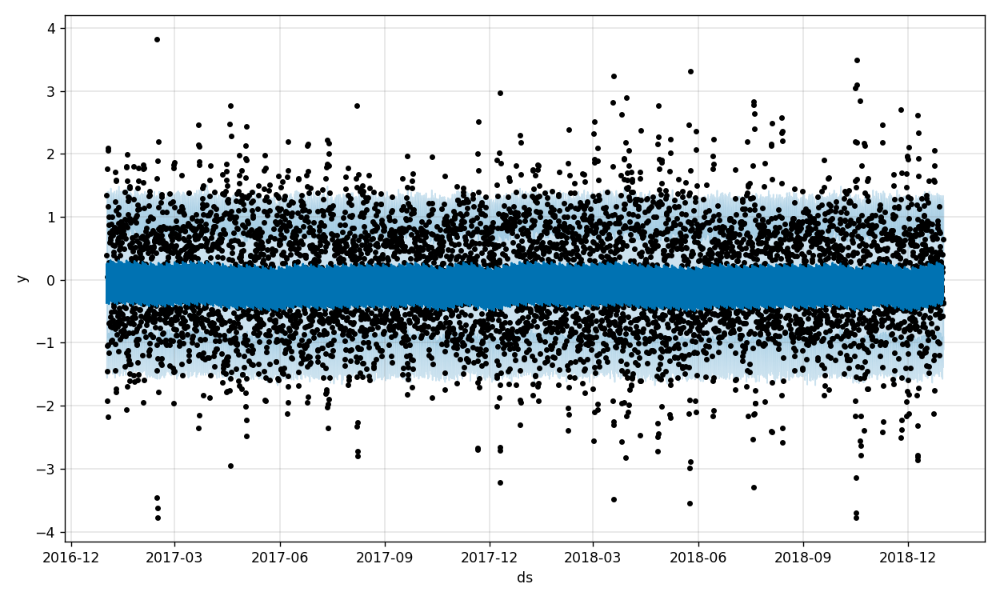

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835 -0.010687   -0.955322    1.340918    -0.010687    -0.010687   
5836 -0.010688   -1.384983    0.894476    -0.010688    -0.010688   
5837 -0.010689   -1.076923    1.169533    -0.010689    -0.010689   
5838 -0.010690   -0.893456    1.271488    -0.010690    -0.010690   
5839 -0.010691   -1.108655    1.128178    -0.010691    -0.010691   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        0.237274              0.237274              0.237274  0.214108   
5836       -0.310051             -0.310051             -0.310051 -0.327690   
5837        0.050468              0.050468              0.050468  0.038414   
5838        0.154101              0.154101              0.154101  0.146963   
5839        0.009681              0.009681              0.009681  0.006086   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     0.214108     0.214108  0.038099 

<IPython.core.display.Javascript object>


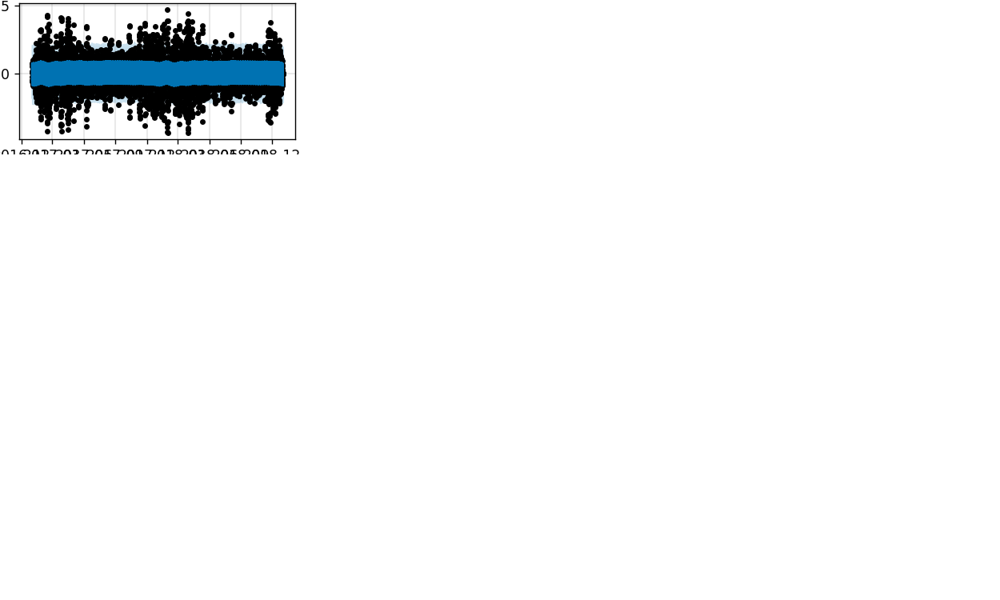

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835 -0.041671   -0.612330    1.889166    -0.041671    -0.041671   
5836 -0.041673   -1.288717    1.291914    -0.041673    -0.041673   
5837 -0.041674   -1.700950    0.806571    -0.041674    -0.041674   
5838 -0.041676   -2.111801    0.467461    -0.041676    -0.041676   
5839 -0.041678   -2.118887    0.416709    -0.041678    -0.041678   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        0.661910              0.661910              0.661910  0.749997   
5836        0.110391              0.110391              0.110391  0.205515   
5837       -0.462216             -0.462216             -0.462216 -0.361822   
5838       -0.814476             -0.814476             -0.814476 -0.711075   
5839       -0.857420             -0.857420             -0.857420 -0.753511   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     0.749997     0.749997 -0.077143 

<IPython.core.display.Javascript object>


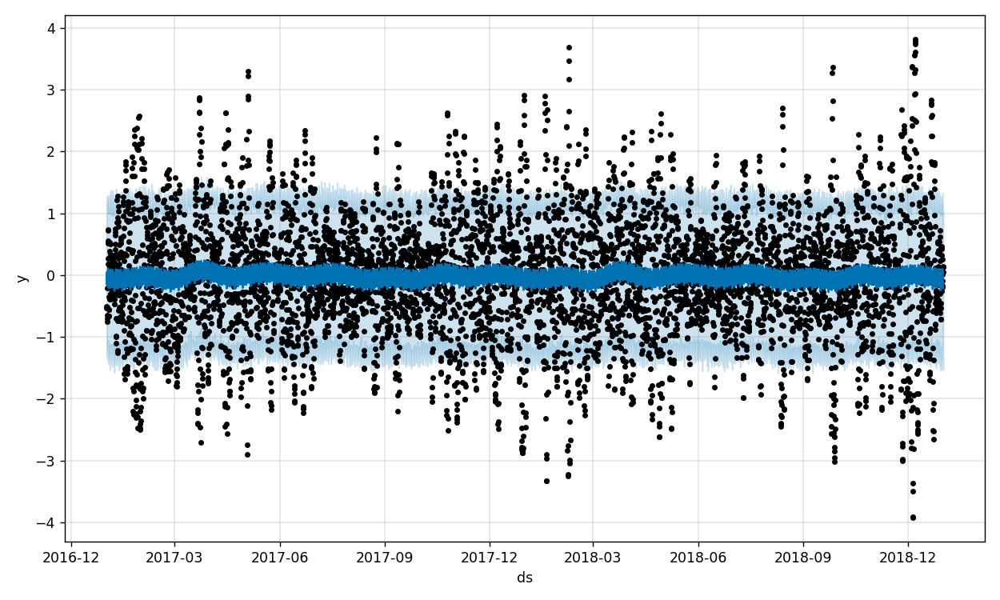

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835 -0.040890   -1.098652    1.265949    -0.040890    -0.040890   
5836 -0.040895   -1.282815    1.156627    -0.040895    -0.040895   
5837 -0.040899   -1.435831    1.117994    -0.040899    -0.040899   
5838 -0.040904   -1.406150    0.942074    -0.040904    -0.040904   
5839 -0.040908   -1.529973    1.032881    -0.040908    -0.040908   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        0.114739              0.114739              0.114739  0.120187   
5836        0.019524              0.019524              0.019524  0.035720   
5837       -0.095175             -0.095175             -0.095175 -0.067079   
5838       -0.170630             -0.170630             -0.170630 -0.130664   
5839       -0.169893             -0.169893             -0.169893 -0.119239   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     0.120187     0.120187 -0.029725 

<IPython.core.display.Javascript object>


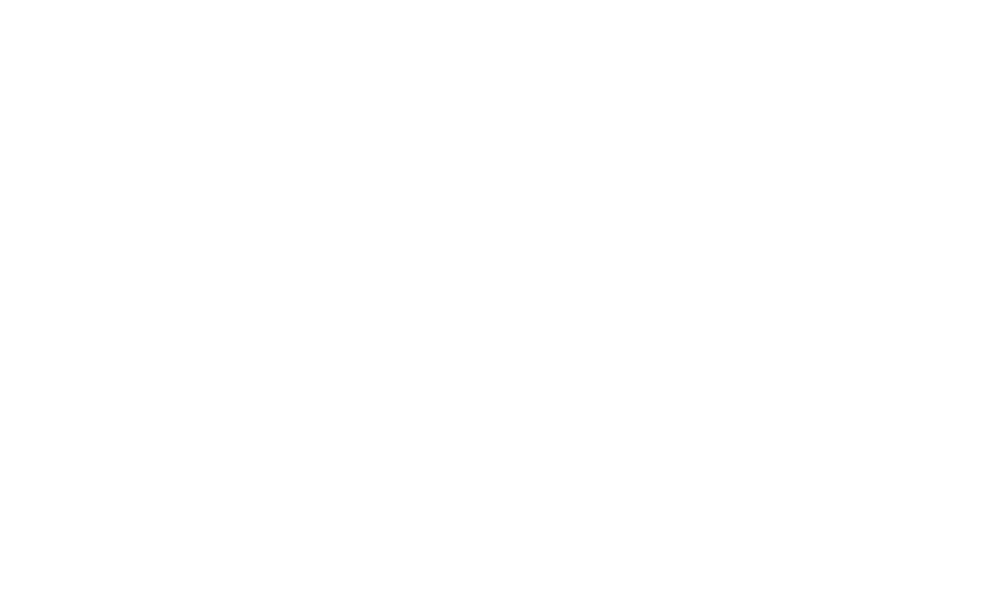

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835 -0.032174   -1.260877    1.299754    -0.032174    -0.032174   
5836 -0.032177   -1.393471    1.296390    -0.032177    -0.032177   
5837 -0.032179   -1.273596    1.174370    -0.032179    -0.032179   
5838 -0.032182   -1.214602    1.223729    -0.032182    -0.032182   
5839 -0.032185   -1.379189    1.213905    -0.032185    -0.032185   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        0.126104              0.126104              0.126104 -0.000194   
5836        0.090085              0.090085              0.090085 -0.000006   
5837        0.050384              0.050384              0.050384  0.000195   
5838        0.009405              0.009405              0.009405  0.000162   
5839       -0.029822             -0.029822             -0.029822  0.000063   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835    -0.000194    -0.000194  0.047721 

<IPython.core.display.Javascript object>


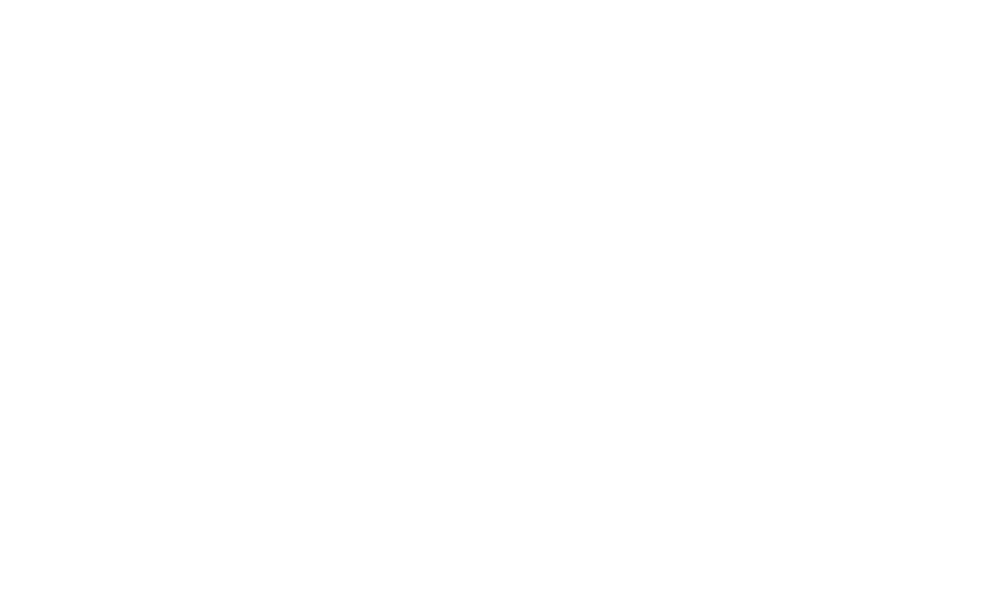

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835 -0.025340   -1.152361    0.883475    -0.025340    -0.025340   
5836 -0.025347   -1.150053    0.900227    -0.025347    -0.025347   
5837 -0.025354   -1.232361    0.964227    -0.025354    -0.025354   
5838 -0.025361   -1.164478    0.961542    -0.025361    -0.025361   
5839 -0.025368   -1.214777    0.975899    -0.025368    -0.025368   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835       -0.093658             -0.093658             -0.093658  0.000197   
5836       -0.096171             -0.096171             -0.096171 -0.000192   
5837       -0.098597             -0.098597             -0.098597 -0.000586   
5838       -0.101011             -0.101011             -0.101011 -0.000963   
5839       -0.103502             -0.103502             -0.103502 -0.001322   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     0.000197     0.000197 -0.076036 

<IPython.core.display.Javascript object>


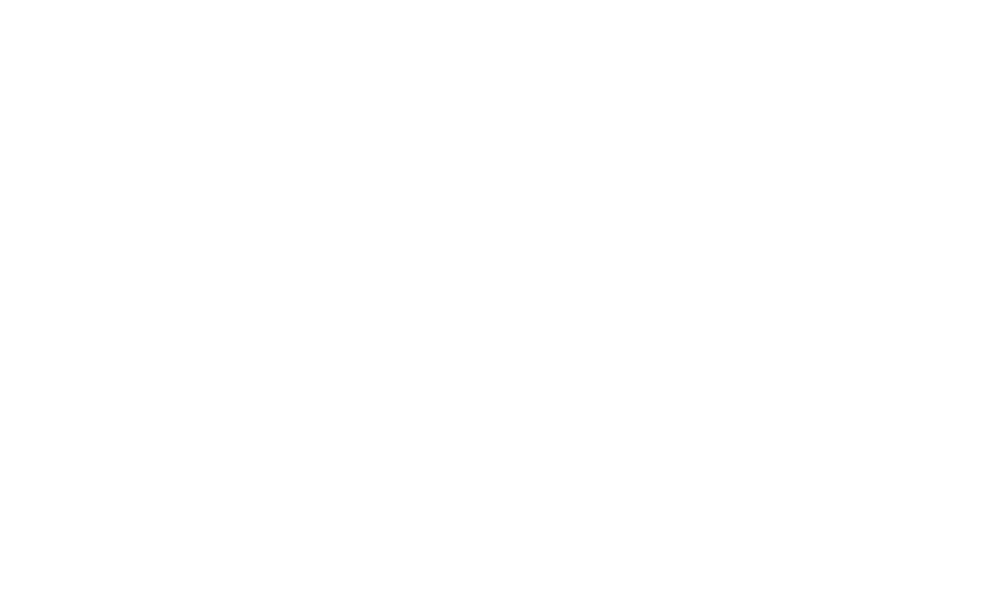

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835 -0.013692   -0.801466    0.799113    -0.013692    -0.013692   
5836 -0.013695   -0.790037    0.756641    -0.013695    -0.013695   
5837 -0.013698   -0.784158    0.736347    -0.013698    -0.013698   
5838 -0.013701   -0.806245    0.770886    -0.013701    -0.013701   
5839 -0.013705   -0.826526    0.793697    -0.013705    -0.013705   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835       -0.001460             -0.001460             -0.001460  0.000037   
5836       -0.003861             -0.003861             -0.003861 -0.000031   
5837       -0.006035             -0.006035             -0.006035 -0.000103   
5838       -0.007988             -0.007988             -0.007988 -0.000175   
5839       -0.009738             -0.009738             -0.009738 -0.000251   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     0.000037     0.000037  0.013001 

<IPython.core.display.Javascript object>


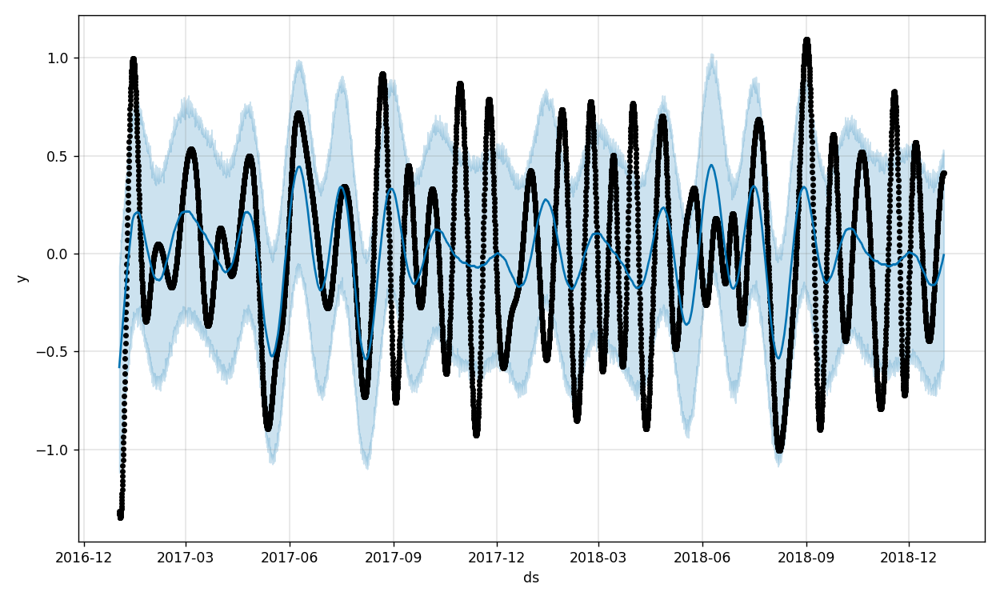

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  0.005398   -0.568932    0.531573     0.005398     0.005398   
5836  0.005400   -0.577493    0.512152     0.005400     0.005400   
5837  0.005402   -0.594926    0.518713     0.005402     0.005402   
5838  0.005404   -0.535510    0.508723     0.005404     0.005404   
5839  0.005406   -0.536828    0.513483     0.005406     0.005406   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835       -0.026621             -0.026621             -0.026621 -0.000100   
5836       -0.022913             -0.022913             -0.022913  0.000091   
5837       -0.019258             -0.019258             -0.019258  0.000287   
5838       -0.015663             -0.015663             -0.015663  0.000488   
5839       -0.012125             -0.012125             -0.012125  0.000690   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835    -0.000100    -0.000100 -0.025294 

<IPython.core.display.Javascript object>


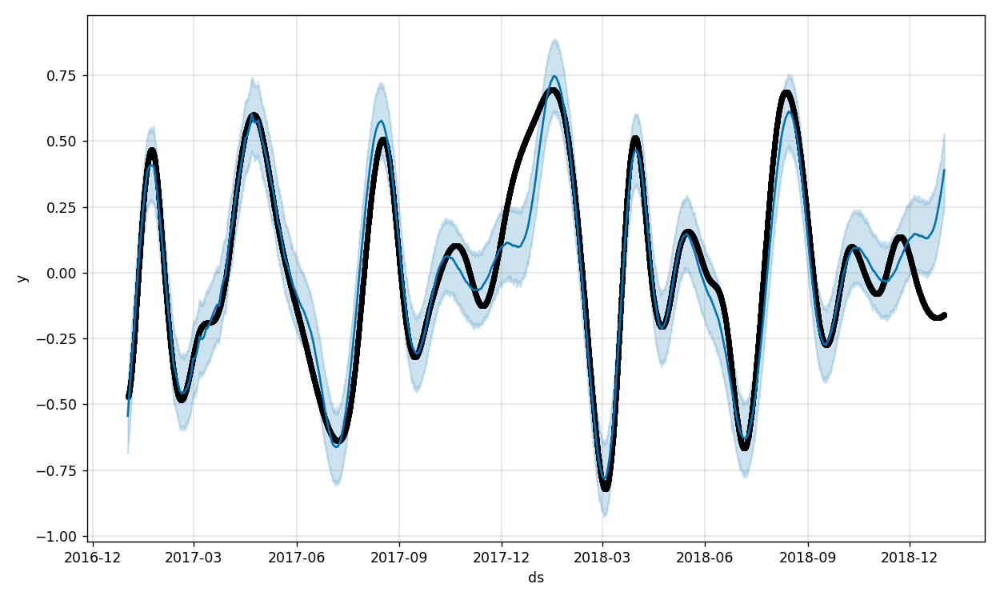

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  0.040601    0.224399    0.508585     0.040601     0.040601   
5836  0.040613    0.242459    0.511719     0.040613     0.040613   
5837  0.040624    0.240540    0.524067     0.040624     0.040624   
5838  0.040636    0.248654    0.523068     0.040636     0.040636   
5839  0.040647    0.248039    0.529169     0.040647     0.040647   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        0.332070              0.332070              0.332070  0.000051   
5836        0.336179              0.336179              0.336179 -0.000044   
5837        0.340395              0.340395              0.340395 -0.000157   
5838        0.344726              0.344726              0.344726 -0.000261   
5839        0.349123              0.349123              0.349123 -0.000380   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     0.000051     0.000051  0.334295 

<IPython.core.display.Javascript object>


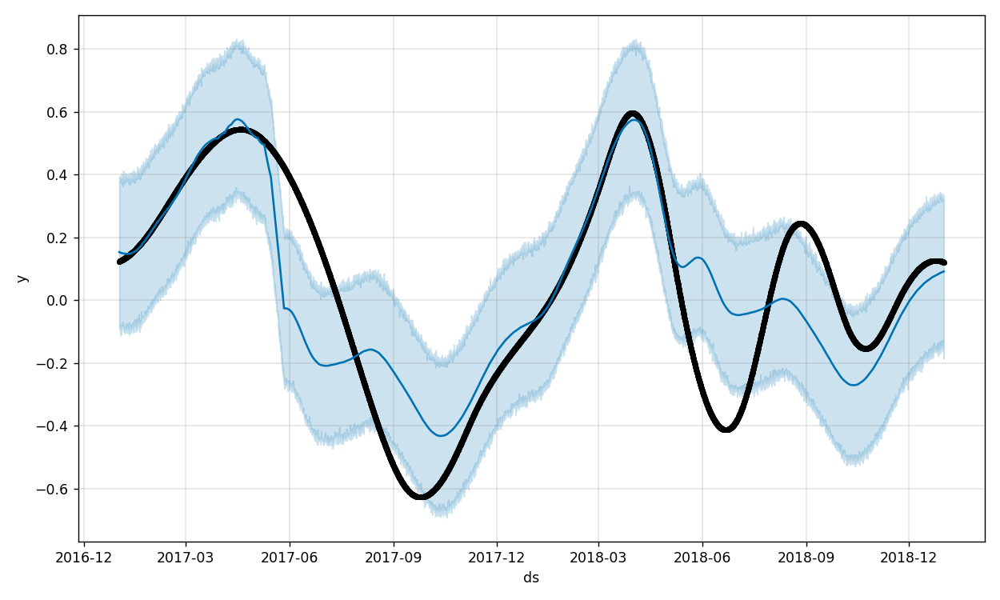

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  0.148116   -0.159723    0.326400     0.148116     0.148116   
5836  0.148171   -0.149137    0.317778     0.148171     0.148171   
5837  0.148227   -0.151852    0.317887     0.148227     0.148227   
5838  0.148282   -0.170613    0.329430     0.148282     0.148282   
5839  0.148337   -0.185753    0.300801     0.148337     0.148337   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835       -0.057114             -0.057114             -0.057114 -0.000010   
5836       -0.056953             -0.056953             -0.056953  0.000003   
5837       -0.056794             -0.056794             -0.056794  0.000016   
5838       -0.056638             -0.056638             -0.056638  0.000029   
5839       -0.056484             -0.056484             -0.056484  0.000041   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835    -0.000010    -0.000010 -0.056931 

<IPython.core.display.Javascript object>


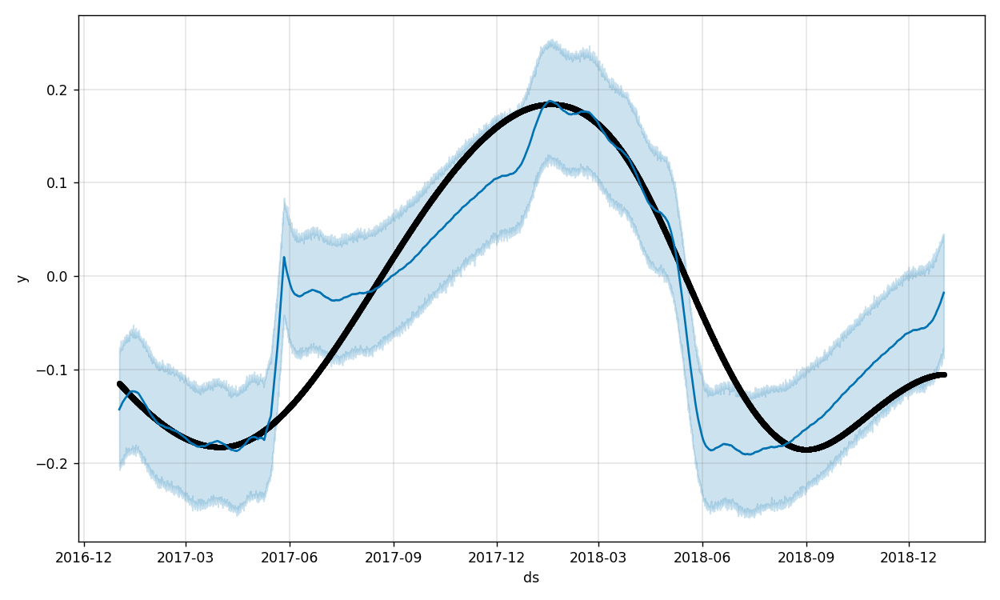

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835 -0.116808   -0.082708    0.045417    -0.116808    -0.116808   
5836 -0.116865   -0.088081    0.043817    -0.116865    -0.116865   
5837 -0.116921   -0.082668    0.041383    -0.116921    -0.116921   
5838 -0.116977   -0.079034    0.044924    -0.116977    -0.116977   
5839 -0.117034   -0.079960    0.044849    -0.117034    -0.117034   

      additive_terms  additive_terms_lower  additive_terms_upper     daily  \
5835        0.097209              0.097209              0.097209  0.000009   
5836        0.097746              0.097746              0.097746 -0.000005   
5837        0.098286              0.098286              0.098286 -0.000033   
5838        0.098852              0.098852              0.098852 -0.000048   
5839        0.099417              0.099417              0.099417 -0.000076   

      daily_lower  daily_upper    yearly  yearly_lower  yearly_upper      yhat  
5835     0.000009     0.000009  0.097360 

<IPython.core.display.Javascript object>


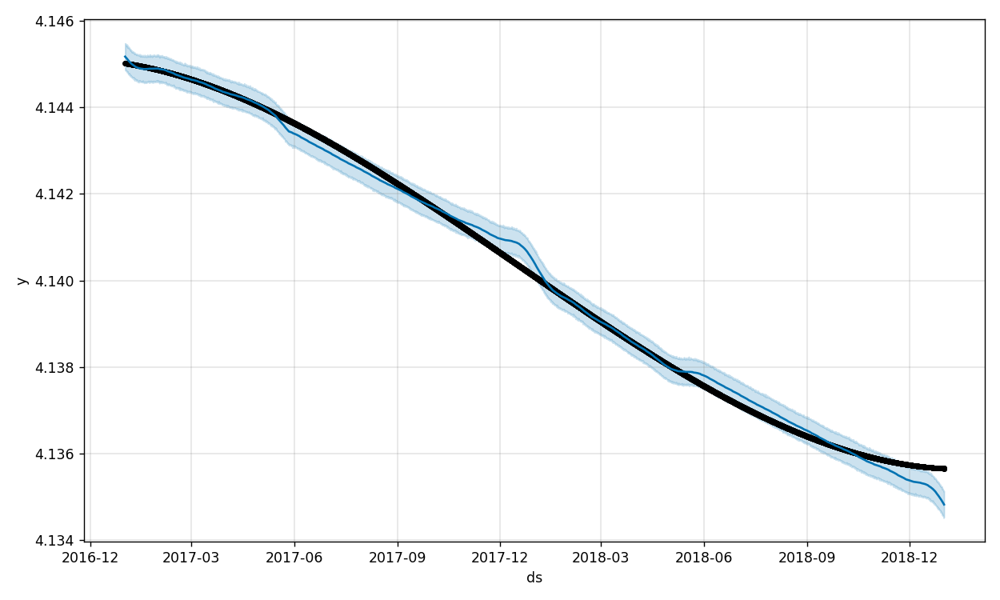

         trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
5835  4.134591    4.134552    4.135136     4.134591     4.134591   
5836  4.134589    4.134513    4.135132     4.134589     4.134589   
5837  4.134588    4.134537    4.135143     4.134588     4.134588   
5838  4.134586    4.134529    4.135125     4.134586     4.134586   
5839  4.134584    4.134527    4.135130     4.134584     4.134584   

      additive_terms  additive_terms_lower  additive_terms_upper  \
5835        0.000257              0.000257              0.000257   
5836        0.000253              0.000253              0.000253   
5837        0.000249              0.000249              0.000249   
5838        0.000245              0.000245              0.000245   
5839        0.000241              0.000241              0.000241   

             daily   daily_lower   daily_upper    yearly  yearly_lower  \
5835 -9.086007e-08 -9.086007e-08 -9.086007e-08  0.000254      0.000254   
5836  8.014202e-08  8.014202e-08  

<IPython.core.display.Javascript object>


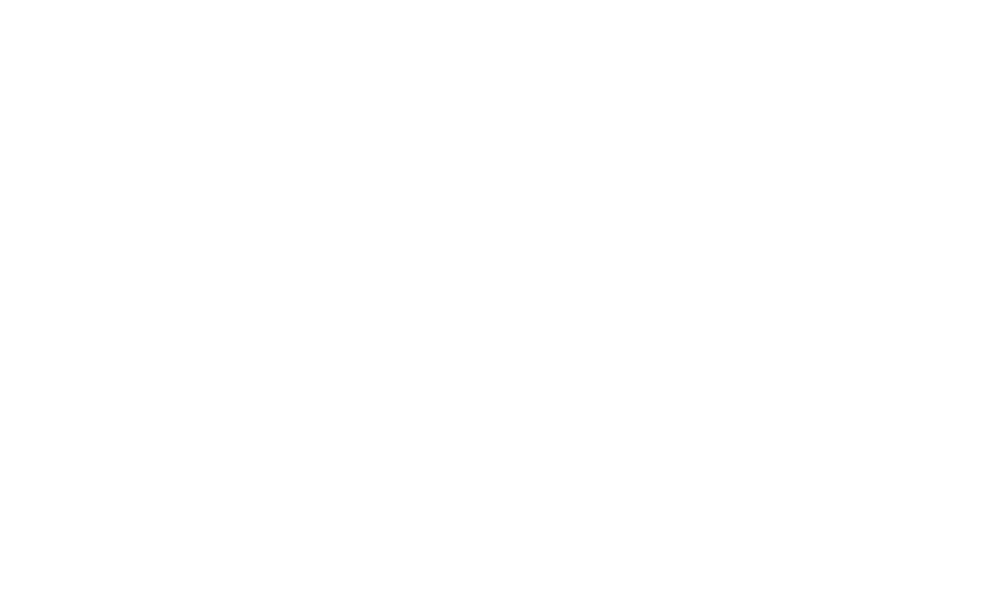

             trend    yhat_lower    yhat_upper   trend_lower   trend_upper  \
5835  2.530972e-17 -6.660082e-16  8.633467e-16  2.530972e-17  2.530972e-17   
5836  2.532038e-17 -7.416145e-16  7.967329e-16  2.532038e-17  2.532038e-17   
5837  2.533103e-17 -6.809746e-16  7.885450e-16  2.533103e-17  2.533103e-17   
5838  2.534168e-17 -7.130200e-16  8.534343e-16  2.534168e-17  2.534168e-17   
5839  2.535234e-17 -7.229070e-16  8.335416e-16  2.535234e-17  2.535234e-17   

      additive_terms  additive_terms_lower  additive_terms_upper  \
5835    8.178628e-17          8.178628e-17          8.178628e-17   
5836    1.338233e-17          1.338233e-17          1.338233e-17   
5837    3.368819e-17          3.368819e-17          3.368819e-17   
5838    4.717782e-17          4.717782e-17          4.717782e-17   
5839    4.538219e-17          4.538219e-17          4.538219e-17   

             daily   daily_lower   daily_upper        yearly  yearly_lower  \
5835  3.626665e-17  3.626665e-17  3.626665e-

In [8]:
X=np.empty((data.shape[0],0))
features = ['trend', 'yhat_lower', 'yhat_upper', 'trend_lower', 'trend_upper', 'additive_terms',
        'additive_terms_lower', 'additive_terms_upper', 'daily', 'daily_lower', 'daily_upper',
        'yearly', 'yearly_lower', 'yearly_upper', 'yhat']
for i in range(0, len(IImfs)):
    temp_df = pd.DataFrame(data['ds'])
    temp_df['y'] = IImfs[i]
    m = Prophet(changepoint_prior_scale=1.0, seasonality_prior_scale=0.1, seasonality_mode='additive', changepoint_range=0.2, yearly_seasonality=True)
    m.fit(temp_df)
    future = m.make_future_dataframe(periods=0, freq='3H')
    forecast = m.predict(future)
    X=np.append(X, forecast[features].to_numpy(), axis=1)
    fig1 = m.plot(forecast)
    fig1.show()
    print(forecast[features].tail())

In [9]:
X.shape

(5840, 1020)

In [10]:
#split the data into training and testing sets
split_line=4672
X_train = np.array(X[:split_line])
X_test = np.array(X[split_line:])
y_train = np.array(y[:split_line])
y_test = np.array(y[split_line:])

In [11]:
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [12]:
X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))

In [13]:
#define the model structure
model = keras.models.Sequential()
model.add(keras.layers.GRU(1024, input_shape = (1, X_train.shape[1:][1]),
                           activation = 'relu', recurrent_activation = 'relu',
                           return_sequences = True))
model.add(keras.layers.GRU(1024, activation = 'sigmoid', recurrent_activation = 'sigmoid', return_sequences = True))
model.add(keras.layers.GRU(1024, activation = 'tanh', recurrent_activation = 'tanh', return_sequences = True))
model.add(keras.layers.Dense(1))

In [14]:
#define the hyperparameters for fitting the data to the model keras.optimizers.Adam(0.001)
model.compile(loss = 'mean_squared_error', optimizer = keras.optimizers.Nadam(0.001))

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 1, 1024)           6285312   
                                                                 
 gru_1 (GRU)                 (None, 1, 1024)           6297600   
                                                                 
 gru_2 (GRU)                 (None, 1, 1024)           6297600   
                                                                 
 dense (Dense)               (None, 1, 1)              1025      
                                                                 
Total params: 18,881,537
Trainable params: 18,881,537
Non-trainable params: 0
_________________________________________________________________


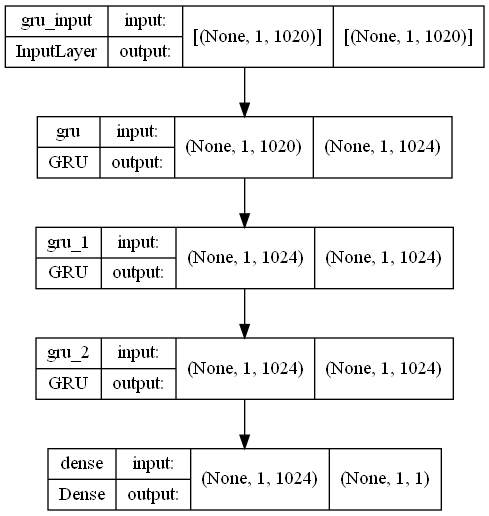

In [15]:
model.summary()
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [16]:
#callback function to stop running epochs when the error does not improve by a specified amount
es_callback = keras.callbacks.EarlyStopping(patience = 200, restore_best_weights = True)

In [21]:
#fit the model
history = model.fit(X_train, y_train, validation_split = 0.1, epochs = 10000, verbose = 1, shuffle = True,
                    callbacks = [es_callback])
#history = model.fit(X_train, y_train, epochs = 200, verbose = 1, shuffle = True)

Epoch 1/10000
132/132 [==============================] - 58s 442ms/step - loss: 2.2966 - val_loss: 6.0457
Epoch 2/10000
132/132 [==============================] - 58s 437ms/step - loss: 2.2024 - val_loss: 7.3399
Epoch 3/10000
132/132 [==============================] - 59s 451ms/step - loss: 2.1196 - val_loss: 6.9533
Epoch 4/10000
132/132 [==============================] - 55s 417ms/step - loss: 2.1045 - val_loss: 8.2218
Epoch 5/10000
132/132 [==============================] - 57s 433ms/step - loss: 2.0559 - val_loss: 7.1999
Epoch 6/10000
132/132 [==============================] - 65s 491ms/step - loss: 2.0796 - val_loss: 8.4701
Epoch 7/10000
132/132 [==============================] - 60s 456ms/step - loss: 1.9622 - val_loss: 6.7174
Epoch 8/10000
132/132 [==============================] - 59s 449ms/step - loss: 1.9132 - val_loss: 7.0268
Epoch 9/10000
132/132 [==============================] - 58s 439ms/step - loss: 1.8211 - val_loss: 7.1016
Epoch 10/10000
132/132 [======================

KeyboardInterrupt: 

In [22]:
#make predictions
predictions = model.predict(X_test)
predictions = predictions.flatten()
print_metrics(predictions[:-1], y_test)

mae:  2.1094779055216777
mse:  7.633907112267838
rmse:  2.7629526076767656
score:  -0.5204861884411802
accuracy:  0.2159383033419023


In [23]:
#print training error for checking over-fitting
mse_train = metrics.mean_absolute_percentage_error((model.predict(X_train)).flatten(), y_train)
print('train mape: ', mse_train)

train mse:  0.8043831261372215


<IPython.core.display.Javascript object>


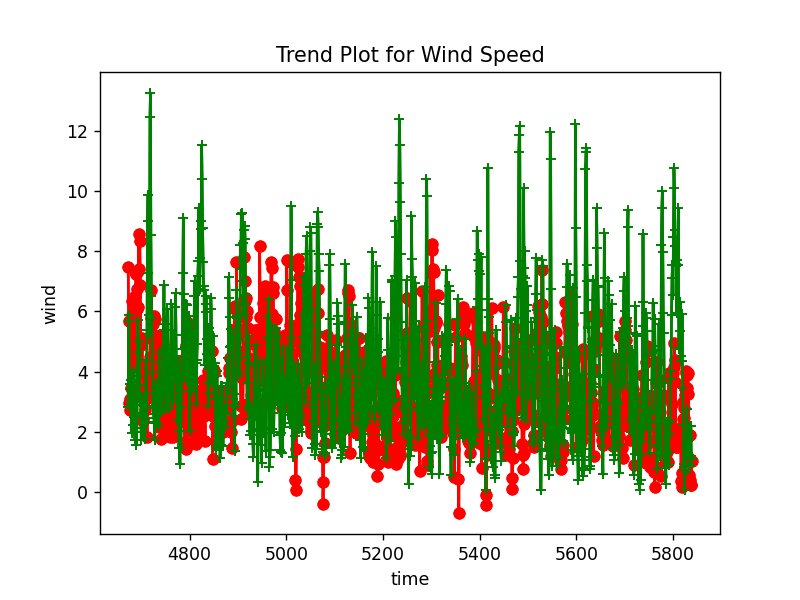

In [24]:
import matplotlib.pyplot as plt
%matplotlib notebook
x1=x2=data[["ds"]][1:][split_line:].index
y1=predictions[:-1]
y2=y_test
plt.plot(x1,y1,'ro-',x2,y2,'g+-')
plt.title('Trend Plot for Wind Speed')
l1=plt.plot(x1,y1,'ro-',label='predict')
l2=plt.plot(x2,y2,'g+-',label='real')
plt.xlabel('time')
plt.ylabel('wind')
plt.show()